In [0]:
!git clone https://github.com/rtqichen/torchdiffeq.git

fatal: destination path 'torchdiffeq' already exists and is not an empty directory.


In [0]:
!cd torchdiffeq && pip install -e .

Obtaining file:///content/torchdiffeq
  Found existing installation: torchdiffeq 0.0.1
    Can't uninstall 'torchdiffeq'. No files were found to uninstall.
  Running setup.py develop for torchdiffeq


In [0]:
!ls torchdiffeq/torchdiffeq

_impl  __init__.py  __pycache__


In [0]:
!wget https://www.dropbox.com/s/wmw93urz7e4mqo5/control_beats_6.npy

--2019-06-11 16:29:12--  https://www.dropbox.com/s/wmw93urz7e4mqo5/control_beats_6.npy
Resolving www.dropbox.com (www.dropbox.com)... 162.125.65.1, 2620:100:6021:1::a27d:4101
Connecting to www.dropbox.com (www.dropbox.com)|162.125.65.1|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: /s/raw/wmw93urz7e4mqo5/control_beats_6.npy [following]
--2019-06-11 16:29:12--  https://www.dropbox.com/s/raw/wmw93urz7e4mqo5/control_beats_6.npy
Reusing existing connection to www.dropbox.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://uc3636229137bb4ba5da755e6d07.dl.dropboxusercontent.com/cd/0/inline/AirTAYnB3O_PAjIRmSHxmbNTvWwG1sfNVDlv5wYpAYE7eYytnrovcLtS07GY8MrZHKlO39VcSQi2WkolwGx39KeNqmRXICOlIySyIE88-C0HNg/file# [following]
--2019-06-11 16:29:12--  https://uc3636229137bb4ba5da755e6d07.dl.dropboxusercontent.com/cd/0/inline/AirTAYnB3O_PAjIRmSHxmbNTvWwG1sfNVDlv5wYpAYE7eYytnrovcLtS07GY8MrZHKlO39VcSQi2WkolwGx39KeNqmRXICOlIySyIE88-C0HNg/

In [0]:
# Preliminaries, importing, intialising ODE and solving it for real Y values

In [0]:
import os
import time
import numpy as np
import numpy.random as npr
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F

# from torchdiffeq.torchdiffeq import odeint

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

from torchdiffeq import odeint

In [0]:
device

device(type='cuda')

In [0]:
beats = np.load('control_beats_6.npy')

In [0]:
def remap(x, out_min, out_max):
    in_min, in_max = np.min(x), np.max(x)
    return (x - in_min) * (out_max - out_min) / (in_max - in_min) + out_min

In [0]:
class LatentODEfunc(nn.Module):

    def __init__(self, latent_dim=4, nhidden=20):
        super(LatentODEfunc, self).__init__()
        self.elu = nn.ELU(inplace=True)
        self.fc1 = nn.Linear(latent_dim, nhidden)
        self.fc2 = nn.Linear(nhidden, nhidden)
        self.fc3 = nn.Linear(nhidden, latent_dim)   # outputs latent state of dim 4
        self.nfe = 0

    def forward(self, t, x): # Note that forward pass has time t as input as well, as compared to RNN where the argument would be no. of neurons in hidden layers!
        self.nfe += 1
        out = self.fc1(x)
        out = self.elu(out)
        out = self.fc2(out)
        out = self.elu(out)
        out = self.fc3(out)
        return out

In [0]:
class RecognitionRNN(nn.Module):

    def __init__(self, latent_dim=4, obs_dim=2, nhidden=25, nbatch=1):
        super(RecognitionRNN, self).__init__()
        self.nhidden = nhidden
        self.nbatch = nbatch
        self.i2h = nn.Linear(obs_dim + nhidden, nhidden)
        self.h2o = nn.Linear(nhidden, latent_dim * 2) # Note that we are outputing twice the size of latent dim, this will go in as qz0_mean and qz0_logvar ... see training loop

    def forward(self, x, h):
        combined = torch.cat((x, h), dim=1)
        h = torch.tanh(self.i2h(combined))
        out = self.h2o(h)
        return out, h

    def initHidden(self):
        return torch.zeros(self.nbatch, self.nhidden)

In [0]:
class Decoder(nn.Module):

    def __init__(self, latent_dim=4, obs_dim=2, nhidden=20):
        super(Decoder, self).__init__()
        self.relu = nn.ReLU(inplace=True)
        self.fc1 = nn.Linear(latent_dim, nhidden)
        self.fc2 = nn.Linear(nhidden, obs_dim)

    def forward(self, z):
        out = self.fc1(z)
        out = self.relu(out)
        out = self.fc2(out)
        return out

In [0]:
#same func as in last colab, we'll use this in training to calculate and show loss
class RunningAverageMeter(object):
    """Computes and stores the average and current value"""

    def __init__(self, momentum=0.99):
        self.momentum = momentum
        self.reset()

    def reset(self):
        self.val = None
        self.avg = 0

    def update(self, val):
        if self.val is None:
            self.avg = val
        else:
            self.avg = self.avg * self.momentum + val * (1 - self.momentum)
        self.val = val

In [0]:
def generate_beats(beats_npy = beats, 
                   ntotal = len(beats[0]) - 1,
                   nsample = 200,
                   noise_std = 0.00,
                  ):
  
  
    orig_ts = np.linspace(0, 1, num=len(beats_npy[0])-1)
    samp_ts = orig_ts[:nsample]
  
    xs = np.array([np.diff(single_beat) for single_beat in beats_npy])
    ys = np.array([single_beat[:-1] for single_beat in beats_npy])
    
    orig_trajs = np.stack((xs, ys), axis=2)#[:1000]

    samp_trajs = []
    
    for i in range(len(orig_trajs)):
      
        orig_traj = orig_trajs[i]
        orig_traj = remap(orig_traj, -1, 1)
        orig_trajs[i] = orig_traj

        samp_traj = orig_traj.copy()
        idx0 = np.random.randint(ntotal - nsample)
        
        samp_traj = samp_traj[idx0:idx0+nsample]
        samp_traj += npr.randn(*samp_traj.shape) * noise_std

        samp_trajs.append(samp_traj)

    # batching for sample trajectories is good for RNN; batching for original
    # trajectories only for ease of indexing
    orig_trajs = np.stack(orig_trajs, axis=0)
    samp_trajs = np.stack(samp_trajs, axis=0)

    return orig_trajs, samp_trajs, orig_ts, samp_ts
  

In [0]:
N = 5000


latent_dim = 50
nhidden = 50
rnn_nhidden = 20
obs_dim = 2
nspiral = N #len(beats)
noise_std = 0.005
ntotal = 499
cutoff = 100
nsample = ntotal - cutoff

In [0]:
# generate toy spiral data like before
orig_trajs, samp_trajs, orig_ts, samp_ts = generate_beats(beats[:N], ntotal, nsample, noise_std)

In [0]:
orig_trajs.shape, samp_trajs.shape, orig_ts.shape, samp_ts.shape

((5000, 499, 2), (5000, 399, 2), (499,), (399,))

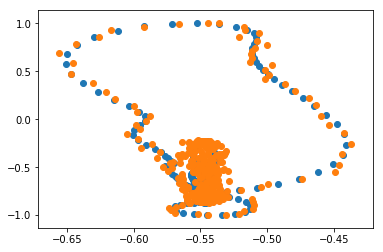

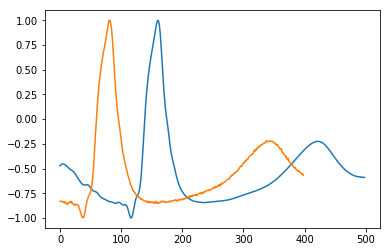

In [0]:
index = 0

plt.figure()
plt.scatter(orig_trajs[index, :, 0], orig_trajs[index, :, 1])
plt.scatter(samp_trajs[index, :, 0], samp_trajs[index, :, 1])
plt.show()

plt.figure()
plt.plot(orig_trajs[index, :, 1])
plt.plot(samp_trajs[index, :, 1])
plt.show()

In [0]:
orig_trajs = torch.from_numpy(orig_trajs).float().to(device)
samp_trajs = torch.from_numpy(samp_trajs).float().to(device)
samp_ts = torch.from_numpy(samp_ts).float().to(device)

In [0]:
func = LatentODEfunc(latent_dim, nhidden).to(device)
rec = RecognitionRNN(latent_dim, obs_dim, rnn_nhidden, nspiral).to(device)
dec = Decoder(latent_dim, obs_dim, nhidden).to(device)

In [0]:
params = (list(func.parameters()) + list(dec.parameters()) + list(rec.parameters()))
#params

In [0]:
optimizer = optim.Adam(params, lr=0.01)
loss_meter = RunningAverageMeter()

In [0]:
samp_trajs.shape, orig_trajs.shape

(torch.Size([5000, 399, 2]), torch.Size([5000, 499, 2]))

In [0]:
#playing with functions in training loop
print(samp_trajs.size())
print(samp_trajs.size(1)) # total dataset size of spirals is 1000 spirals but each sampled spiral has 100 datapoints

h = rec.initHidden().to(device) # for recurrent nn
for t in reversed(range(samp_trajs.size(1))):
        obs = samp_trajs[:, t, :]
#         print(obs.shape)
        out, h = rec.forward(obs, h) # init forward pass to start rnn

print(out.size(), h.size()) #weights

qz0_mean, qz0_logvar = out[:, :latent_dim], out[:, latent_dim:]
epsilon = torch.randn(qz0_mean.size()).to(device)
z0 = epsilon * torch.exp(.5 * qz0_logvar) + qz0_mean

print('z0 size = ', z0.size())
pred_z = odeint(func, z0, samp_ts)
print('pred_z size = ', pred_z.size())
pred_z = pred_z.permute(1, 0, 2)
print('pred_z size after changing axes = ',pred_z.size())
pred_x = dec(pred_z)
print('pred_x size = ',pred_x.size())

torch.Size([5000, 399, 2])
399
torch.Size([5000, 100]) torch.Size([5000, 20])
z0 size =  torch.Size([5000, 50])
pred_z size =  torch.Size([399, 5000, 50])
pred_z size after changing axes =  torch.Size([5000, 399, 50])
pred_x size =  torch.Size([5000, 399, 2])


In [0]:
def log_normal_pdf(x, mean, logvar):
#     const = torch.from_numpy(np.array([2. * np.pi])).float().to(x.device)
#     const = torch.log(const)
#     return -.5 * (const + logvar + (x - mean) ** 2. / torch.exp(logvar))
    return -.5 * (logvar + (x - mean) ** 2. / torch.exp(logvar))

  
def normal_kl(mu1, lv1, mu2, lv2):
    v1 = torch.exp(lv1)
    v2 = torch.exp(lv2)
    lstd1 = lv1 / 2.
    lstd2 = lv2 / 2.

    kl = lstd2 - lstd1 + ((v1 + (mu1 - mu2) ** 2.) / (2. * v2)) - .5
    return kl

Iter: 10, running avg elbo: -6921834.6062


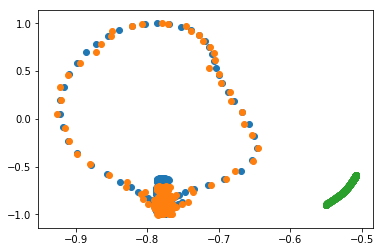

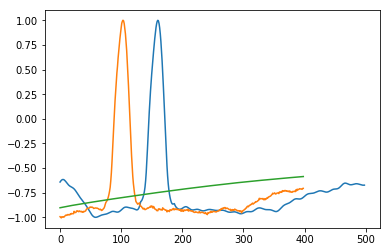

Iter: 20, running avg elbo: -6397772.2512


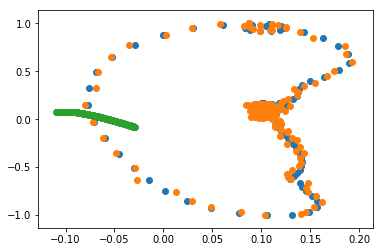

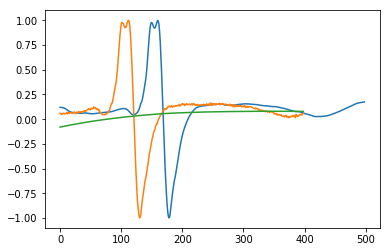

Iter: 30, running avg elbo: -5903210.7484


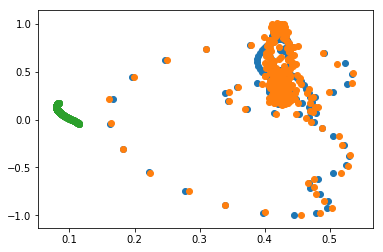

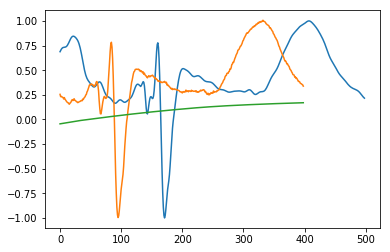

Iter: 40, running avg elbo: -5447497.5628


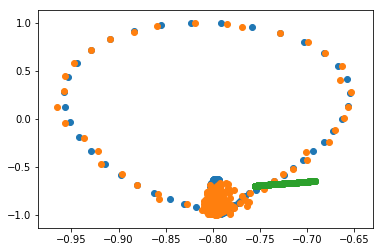

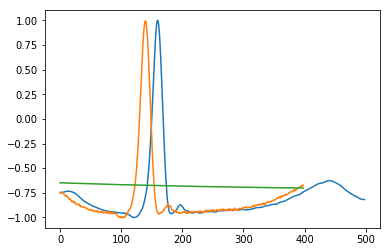

Iter: 50, running avg elbo: -5029831.5320


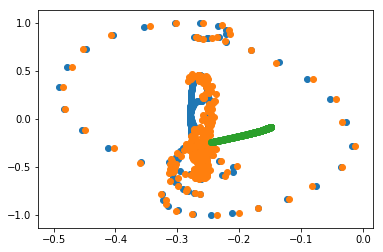

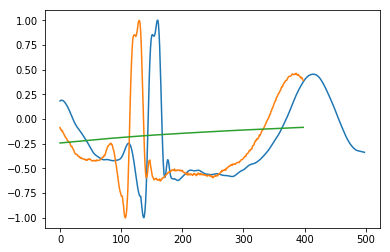

Iter: 60, running avg elbo: -4648418.8714


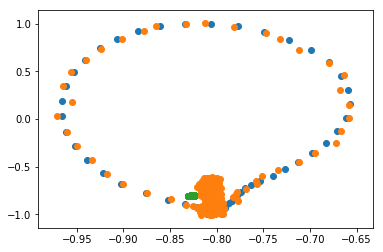

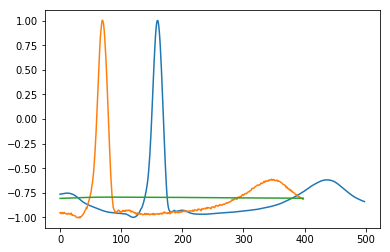

Iter: 70, running avg elbo: -4305197.5469


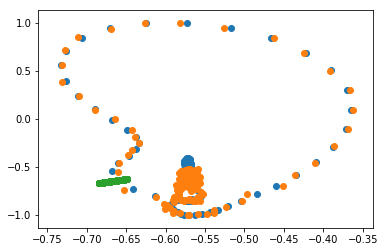

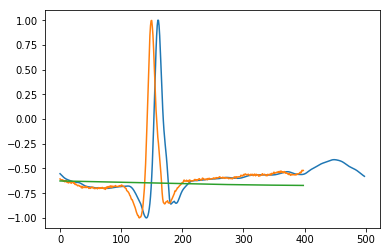

Iter: 80, running avg elbo: -3995666.4182


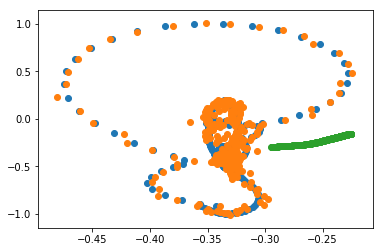

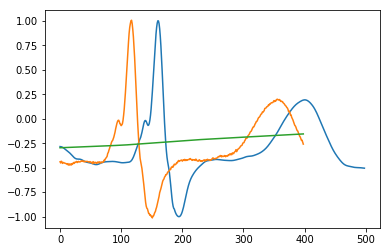

Iter: 90, running avg elbo: -3713170.8445


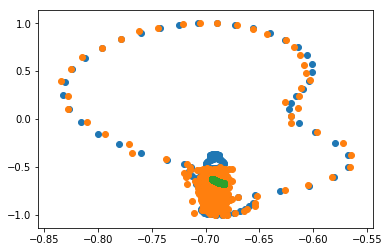

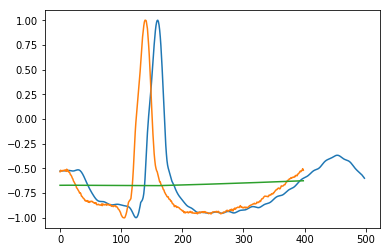

Iter: 100, running avg elbo: -3455126.9239


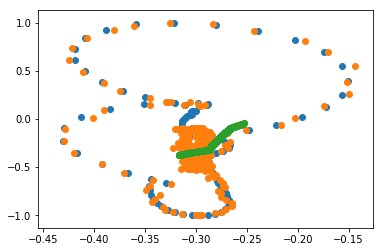

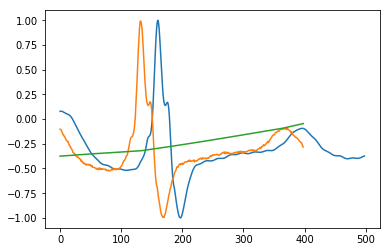

Iter: 110, running avg elbo: -3218933.7575


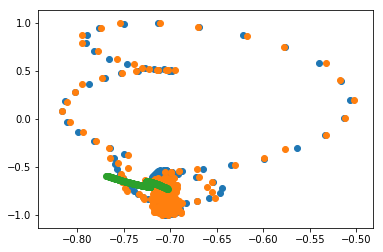

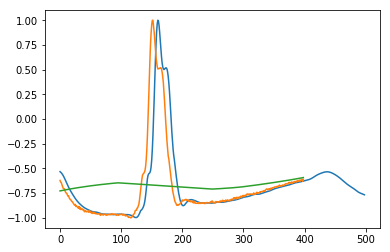

Iter: 120, running avg elbo: -3014745.1206


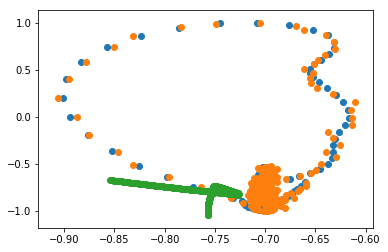

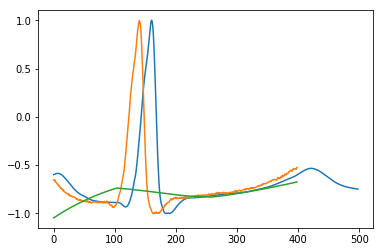

Iter: 130, running avg elbo: -2821732.2574


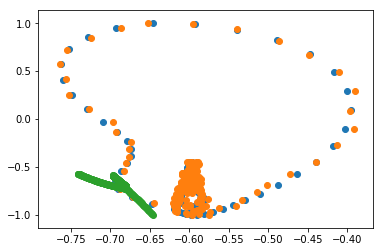

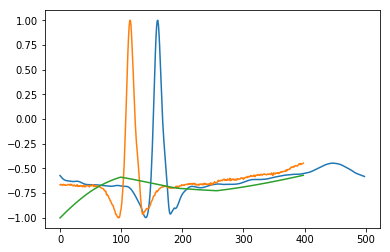

Iter: 140, running avg elbo: -2641495.7979


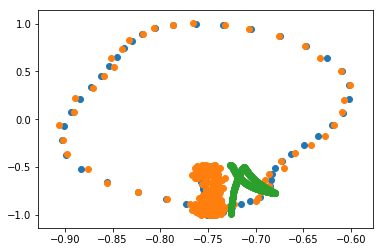

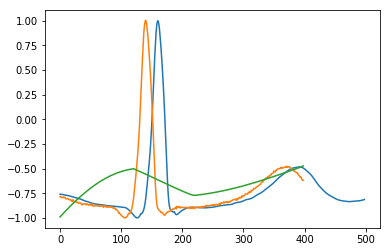

Iter: 150, running avg elbo: -2475076.0337


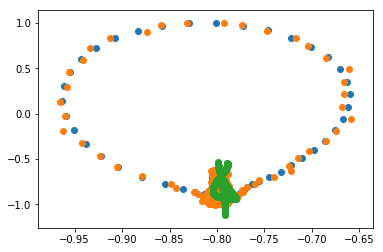

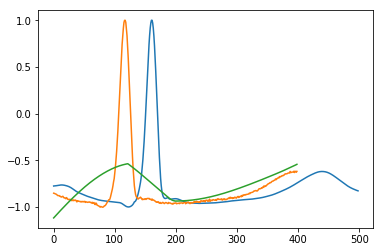

Iter: 160, running avg elbo: -2322883.6294


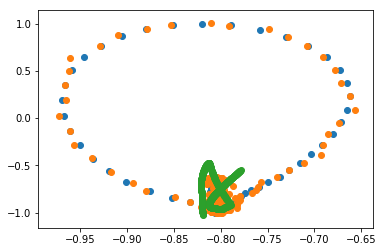

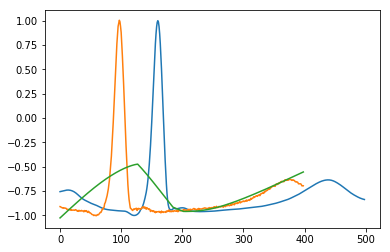

Iter: 170, running avg elbo: -2184028.7734


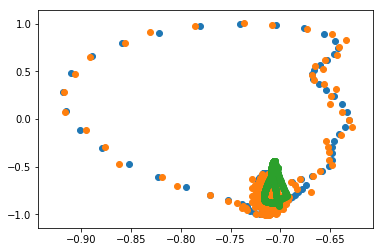

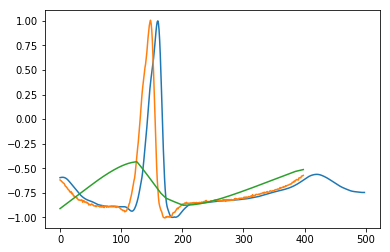

Iter: 180, running avg elbo: -2057491.9732


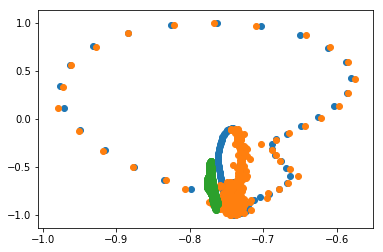

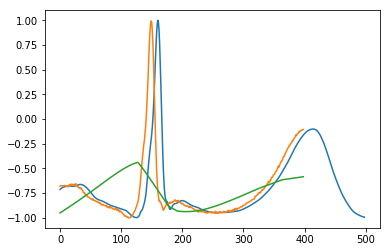

Iter: 190, running avg elbo: -1942401.9209


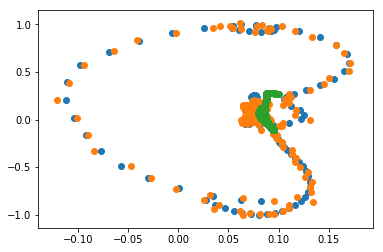

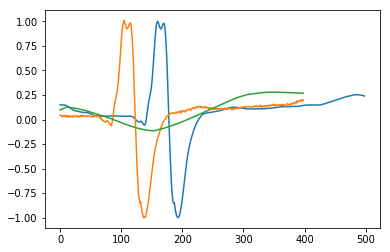

Iter: 200, running avg elbo: -1845961.6990


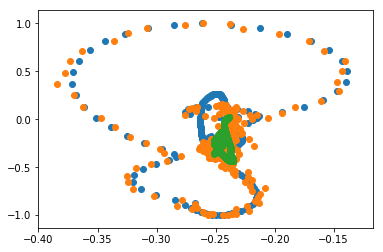

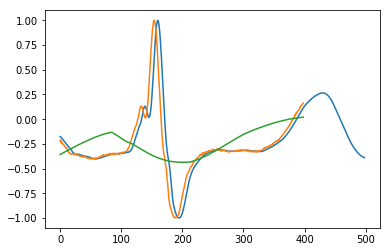

Iter: 210, running avg elbo: -1753104.0552


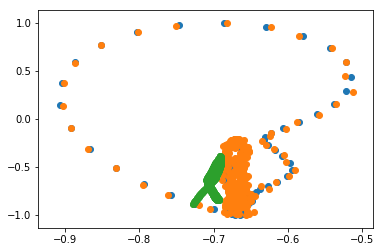

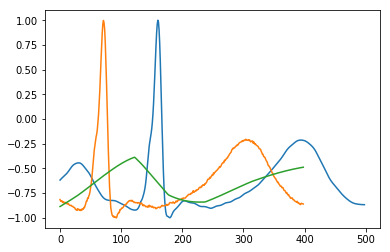

Iter: 220, running avg elbo: -1667128.2669


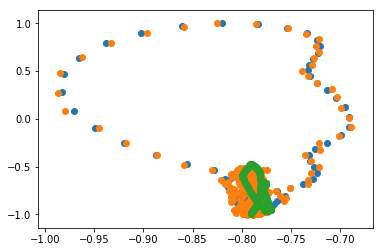

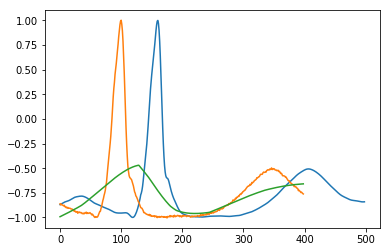

Iter: 230, running avg elbo: -1588117.2918


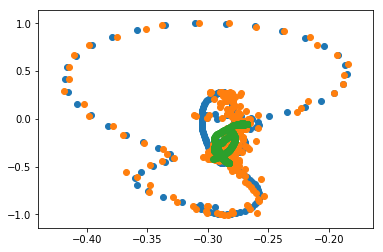

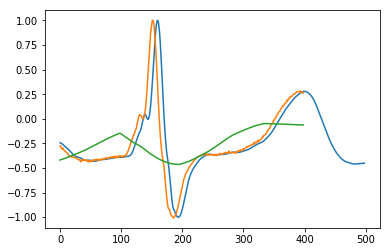

Iter: 240, running avg elbo: -1515409.5476


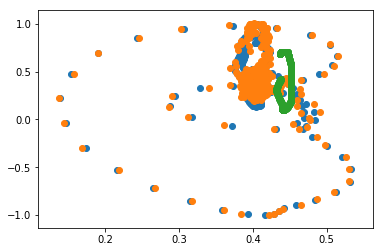

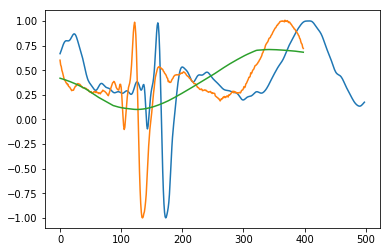

Iter: 250, running avg elbo: -1450441.7941


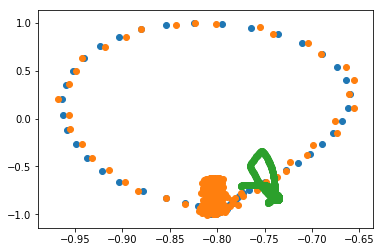

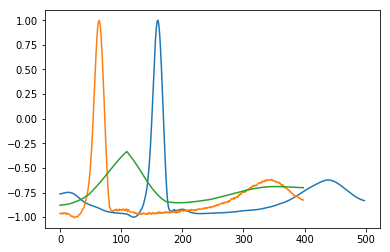

Iter: 260, running avg elbo: -1392572.1911


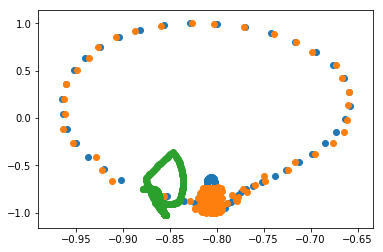

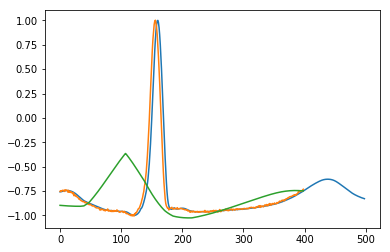

Iter: 270, running avg elbo: -1338877.6870


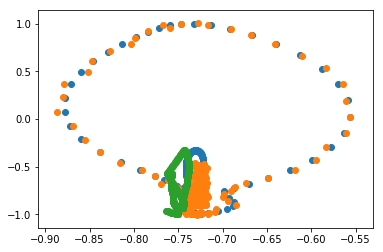

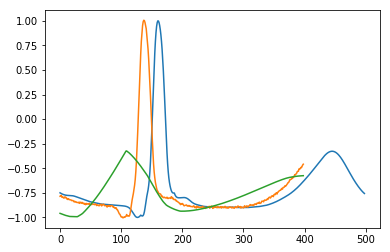

Iter: 280, running avg elbo: -1286057.9978


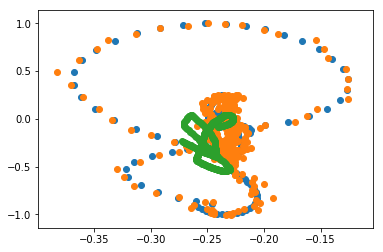

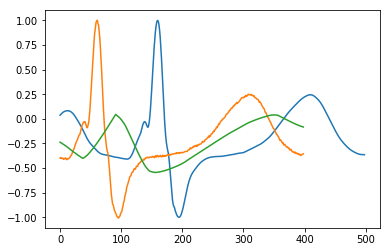

Iter: 290, running avg elbo: -1234003.3161


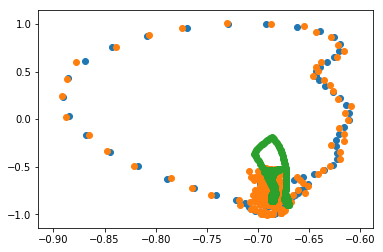

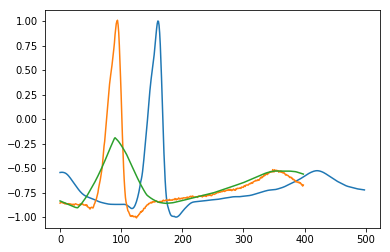

Iter: 300, running avg elbo: -1184479.6758


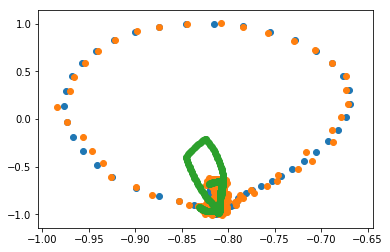

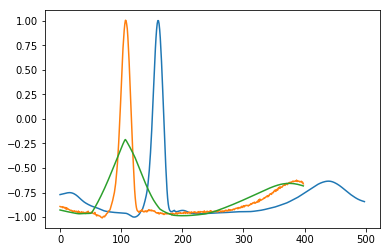

Iter: 310, running avg elbo: -1145381.4743


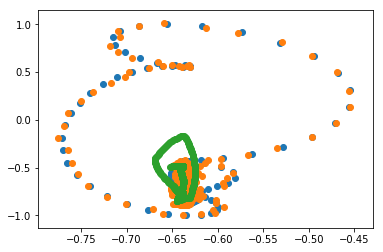

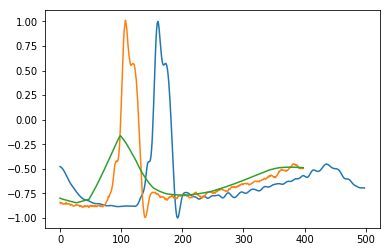

Iter: 320, running avg elbo: -1106028.9091


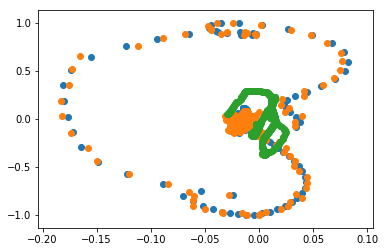

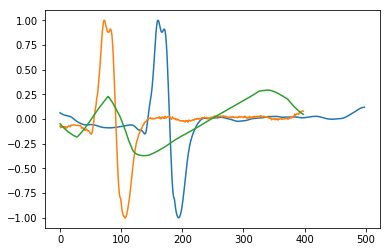

Iter: 330, running avg elbo: -1066910.3187


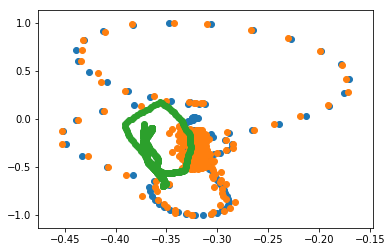

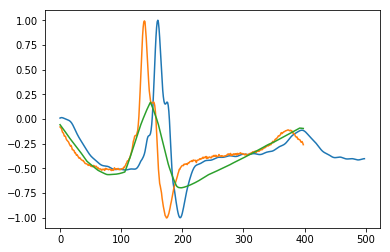

Iter: 340, running avg elbo: -1031512.9442


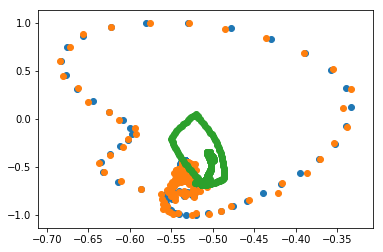

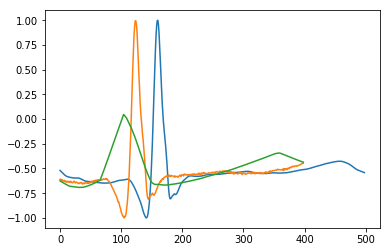

Iter: 350, running avg elbo: -998833.2930


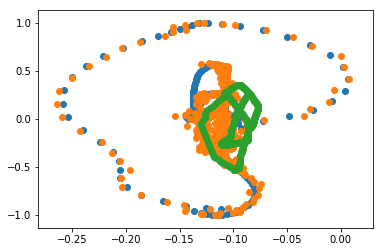

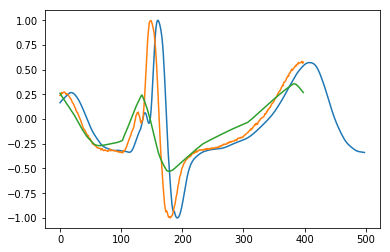

Iter: 360, running avg elbo: -968911.9048


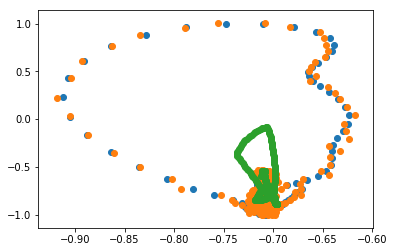

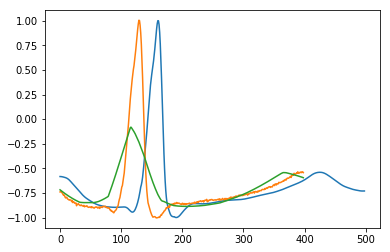

Iter: 370, running avg elbo: -940316.9060


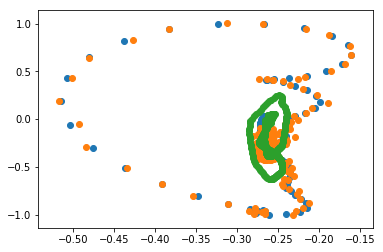

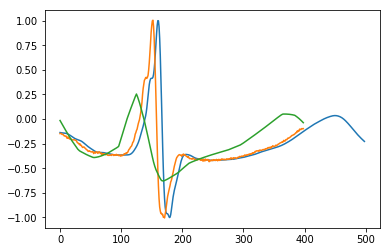

Iter: 380, running avg elbo: -916106.7185


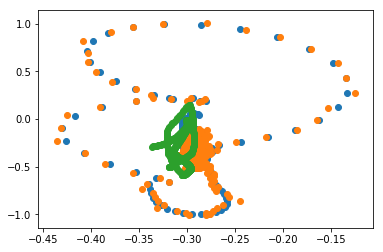

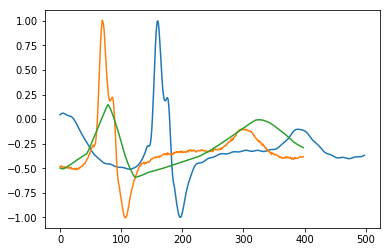

Iter: 390, running avg elbo: -892839.9944


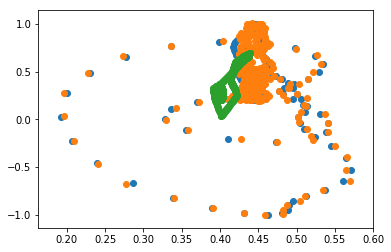

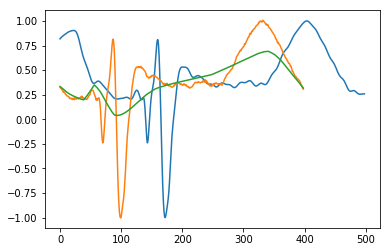

Iter: 400, running avg elbo: -873764.9750


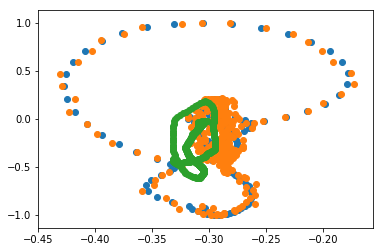

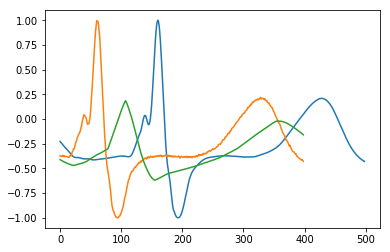

Iter: 410, running avg elbo: -854693.8885


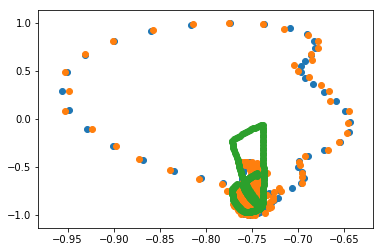

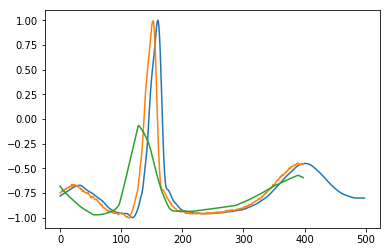

Iter: 420, running avg elbo: -836441.3745


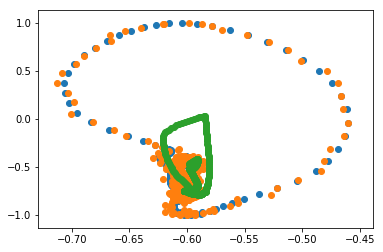

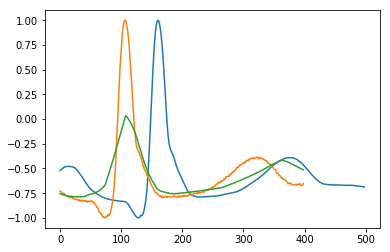

Iter: 430, running avg elbo: -821770.6196


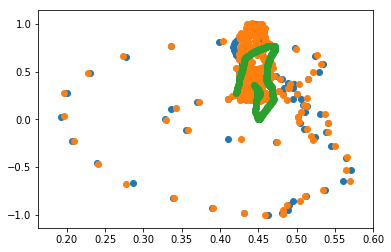

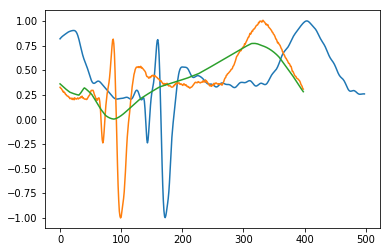

Iter: 440, running avg elbo: -806383.9825


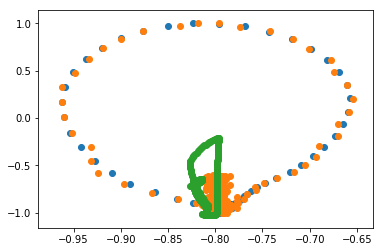

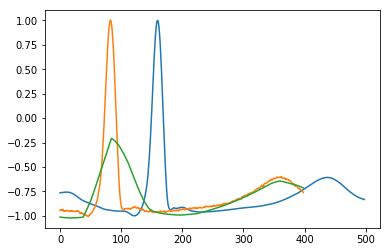

Iter: 450, running avg elbo: -791317.3296


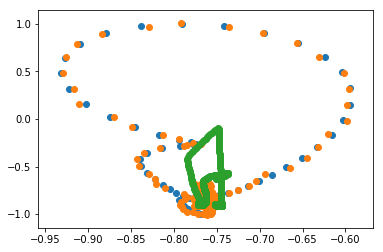

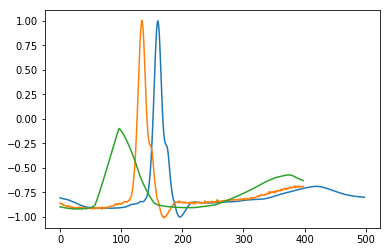

Iter: 460, running avg elbo: -778150.4304


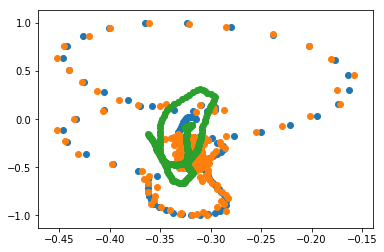

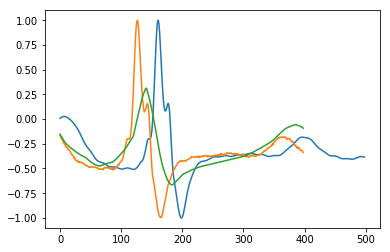

Iter: 470, running avg elbo: -767212.2567


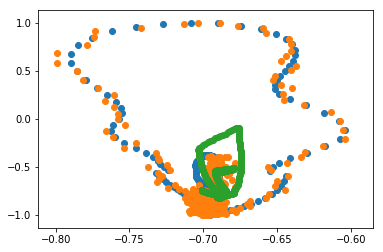

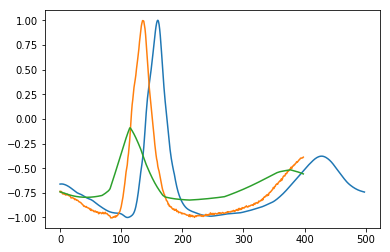

Iter: 480, running avg elbo: -756313.7365


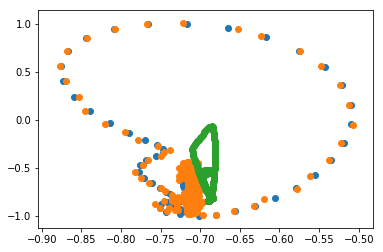

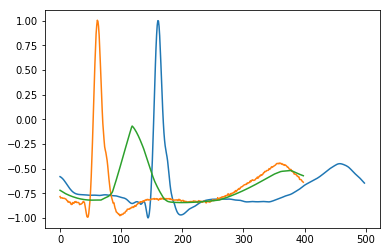

Iter: 490, running avg elbo: -744584.7669


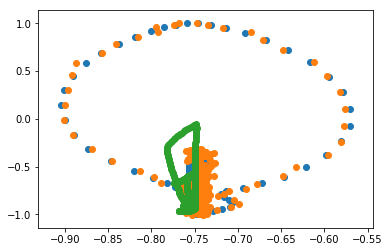

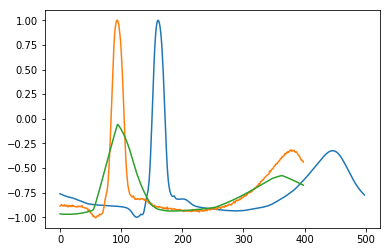

Iter: 500, running avg elbo: -733644.6344


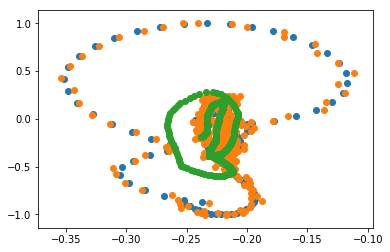

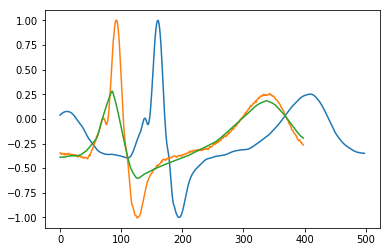

Iter: 510, running avg elbo: -723381.4689


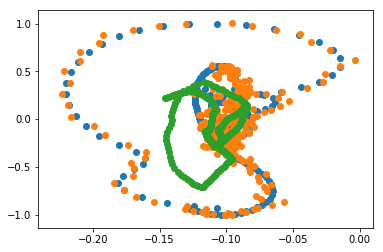

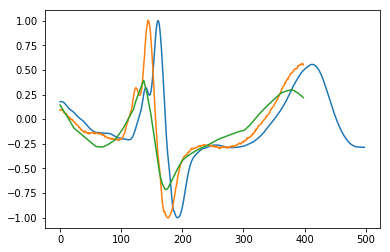

Iter: 520, running avg elbo: -713565.1588


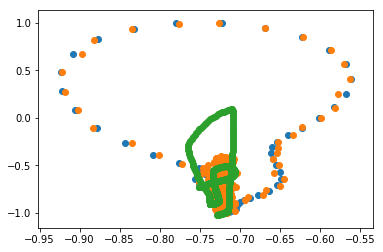

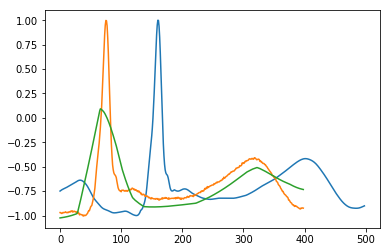

Iter: 530, running avg elbo: -705550.8523


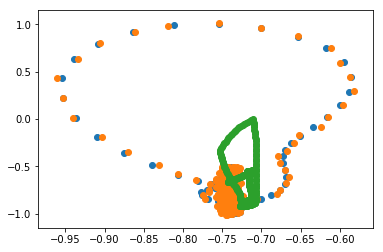

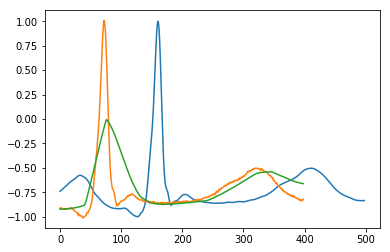

Iter: 540, running avg elbo: -698807.3362


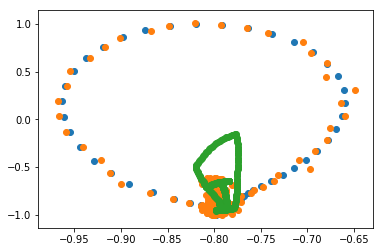

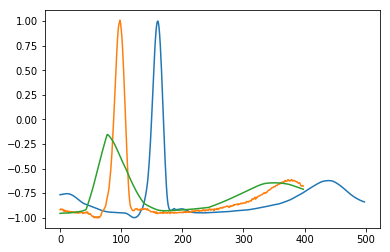

Iter: 550, running avg elbo: -693141.3714


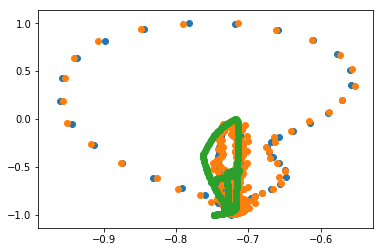

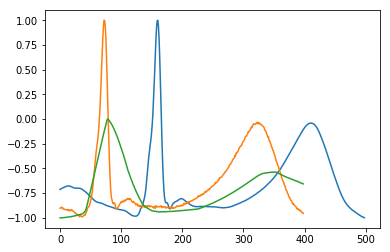

Iter: 560, running avg elbo: -686570.2650


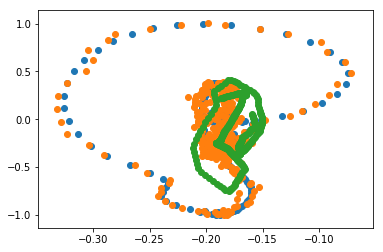

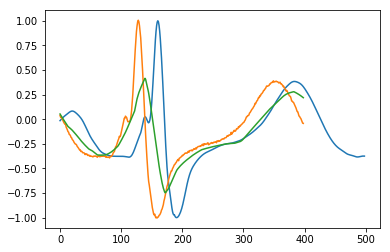

Iter: 570, running avg elbo: -681234.2377


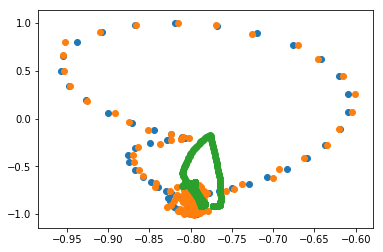

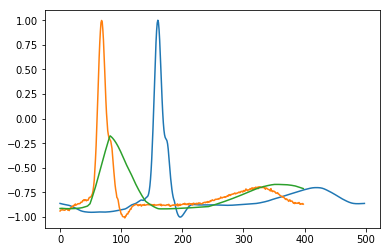

Iter: 580, running avg elbo: -676873.6119


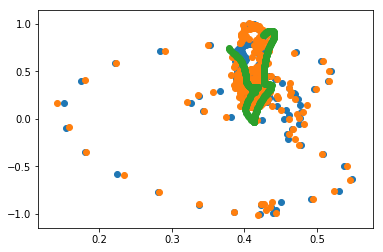

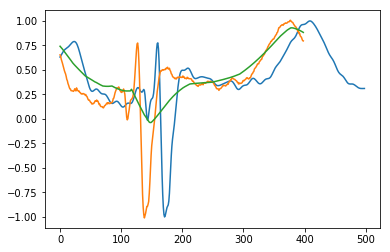

Iter: 590, running avg elbo: -673470.8308


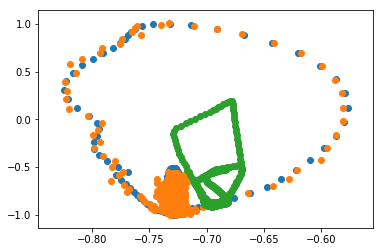

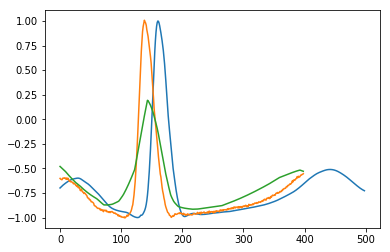

Iter: 600, running avg elbo: -668565.0817


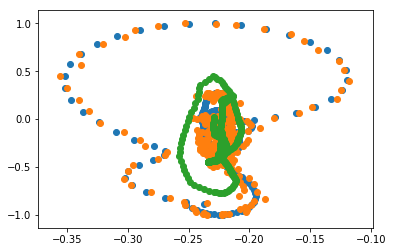

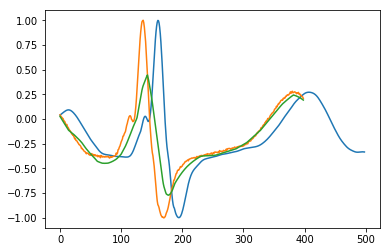

Iter: 610, running avg elbo: -663729.1225


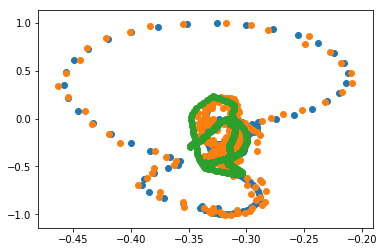

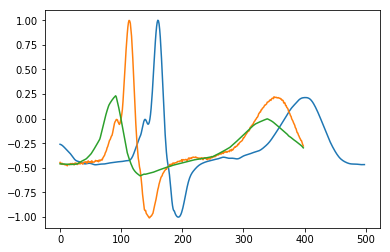

Iter: 620, running avg elbo: -659050.4548


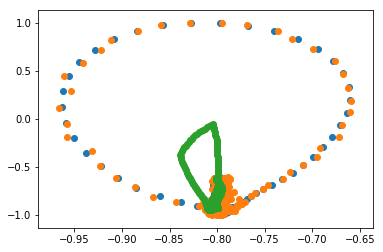

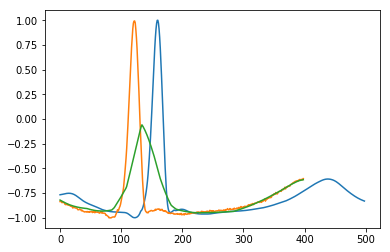

Iter: 630, running avg elbo: -654920.5379


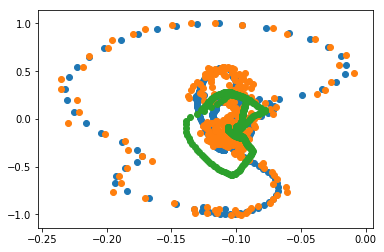

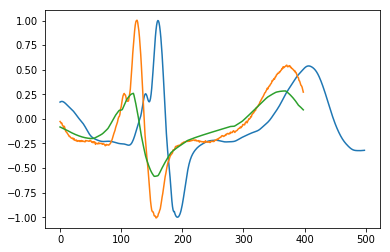

Iter: 640, running avg elbo: -650781.2009


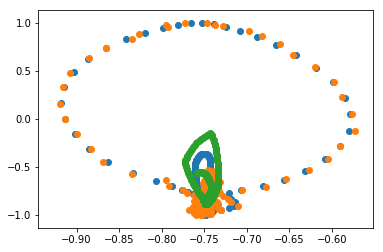

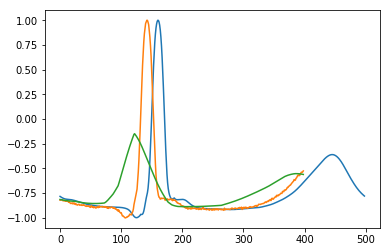

Iter: 650, running avg elbo: -647320.7790


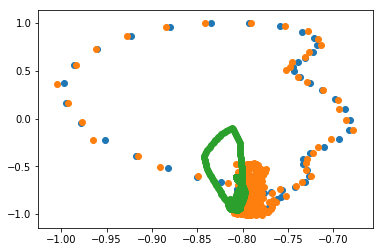

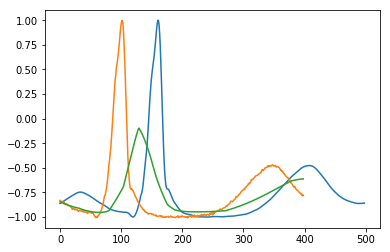

Iter: 660, running avg elbo: -644013.4867


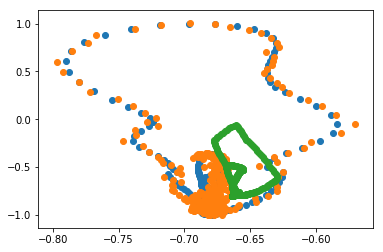

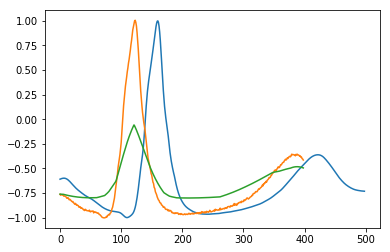

Iter: 670, running avg elbo: -641372.6118


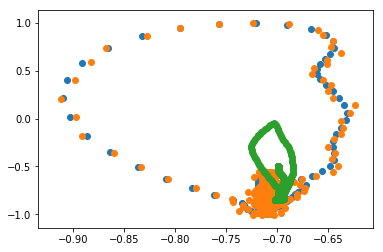

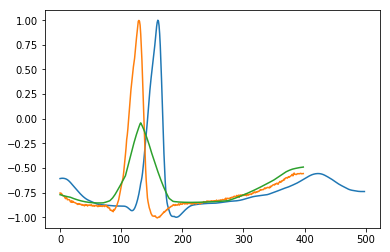

Iter: 680, running avg elbo: -639252.0580


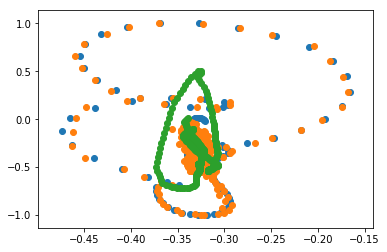

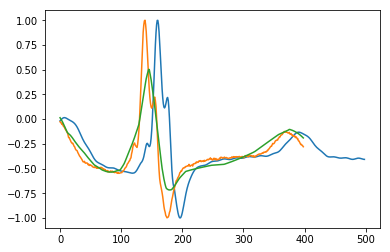

Iter: 690, running avg elbo: -638408.1713


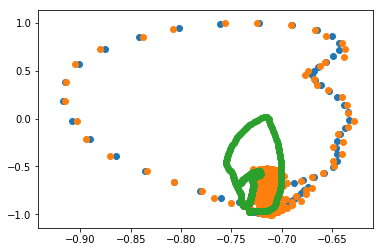

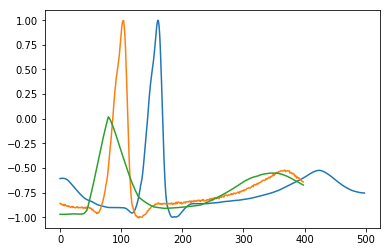

Iter: 700, running avg elbo: -636940.4962


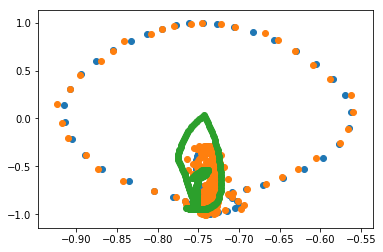

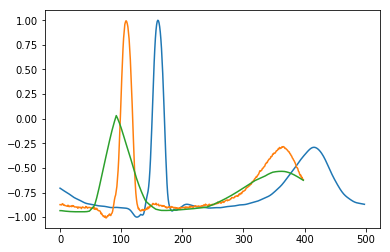

Iter: 710, running avg elbo: -635291.4361


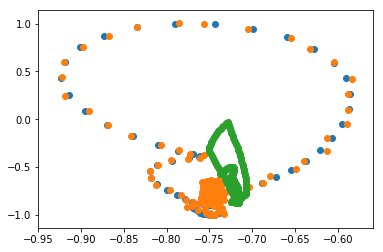

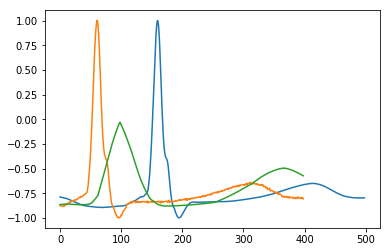

Iter: 720, running avg elbo: -633350.6608


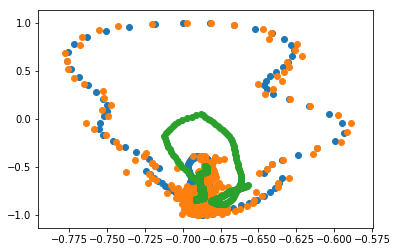

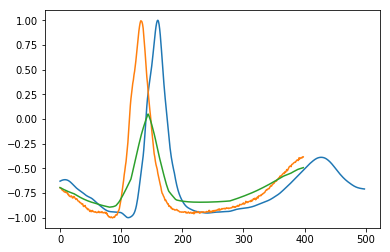

Iter: 730, running avg elbo: -631887.6569


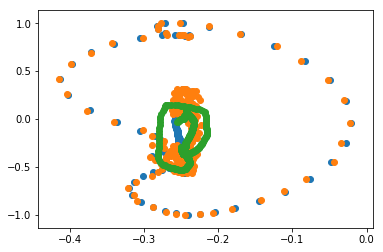

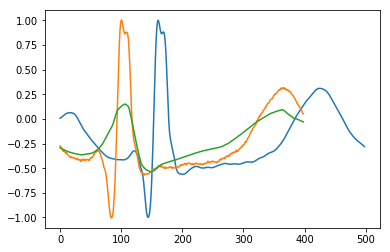

Iter: 740, running avg elbo: -633492.9302


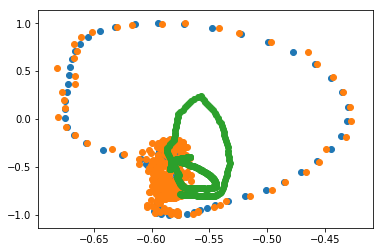

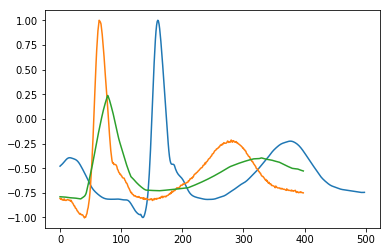

Iter: 750, running avg elbo: -633662.3958


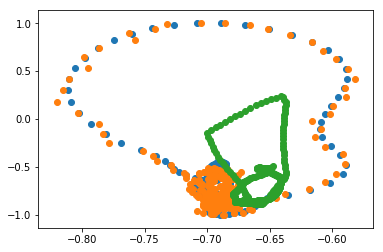

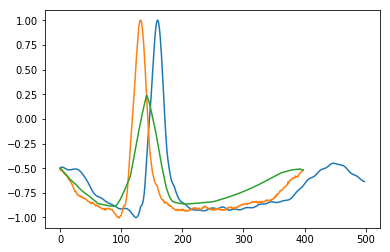

Iter: 760, running avg elbo: -631119.5057


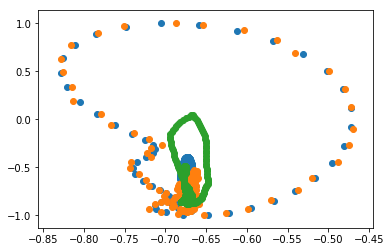

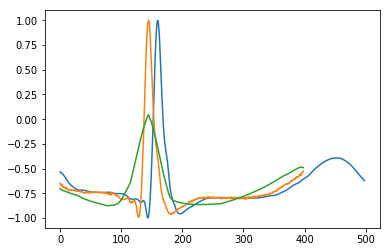

Iter: 770, running avg elbo: -628809.8571


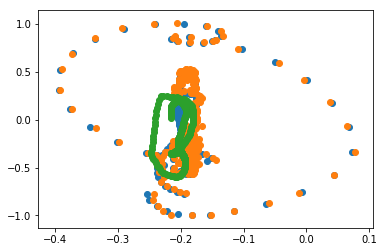

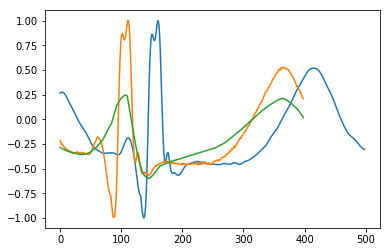

Iter: 780, running avg elbo: -627689.4400


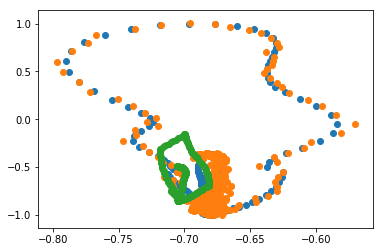

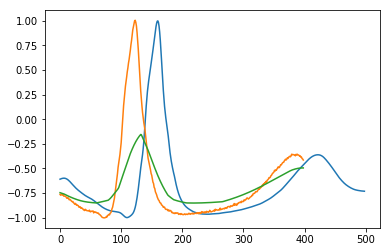

Iter: 790, running avg elbo: -626631.6622


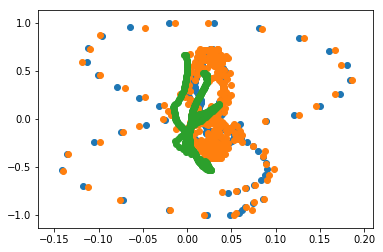

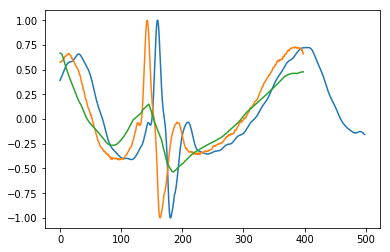

Iter: 800, running avg elbo: -627188.3833


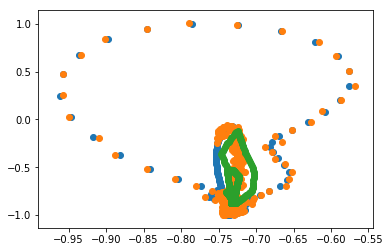

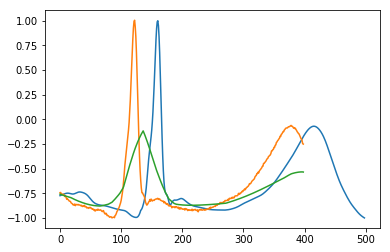

Iter: 810, running avg elbo: -627312.8898


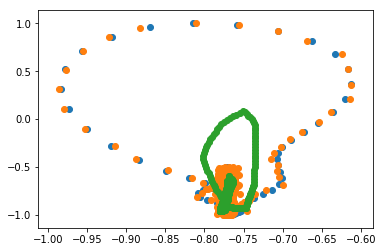

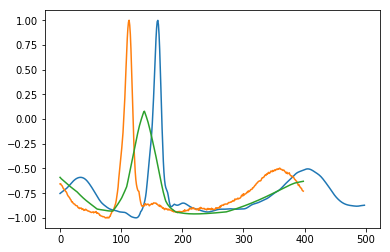

Iter: 820, running avg elbo: -625988.8234


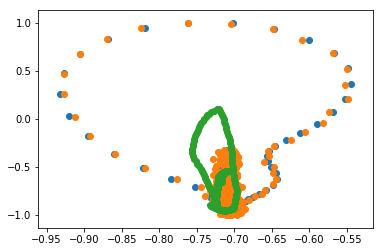

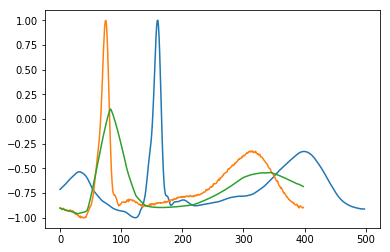

Iter: 830, running avg elbo: -626838.8347


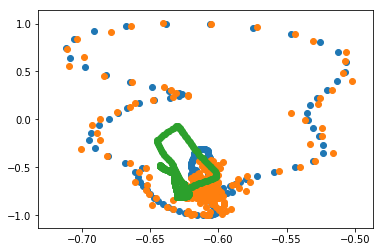

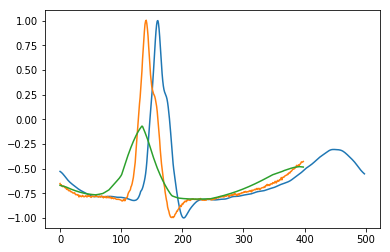

Iter: 840, running avg elbo: -627202.0673


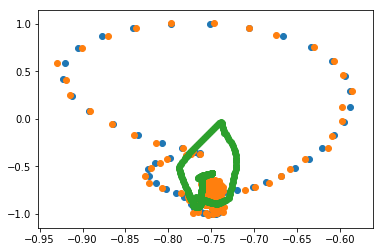

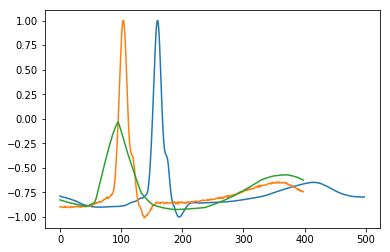

Iter: 850, running avg elbo: -626523.1723


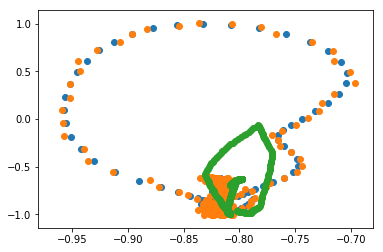

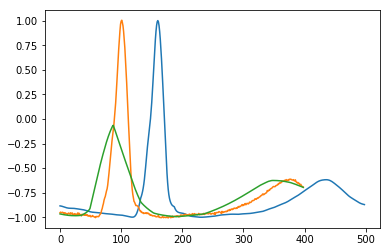

Iter: 860, running avg elbo: -624424.9545


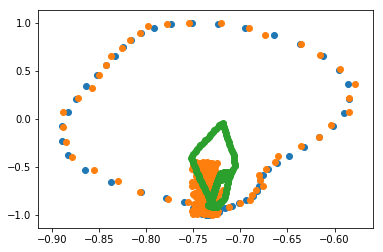

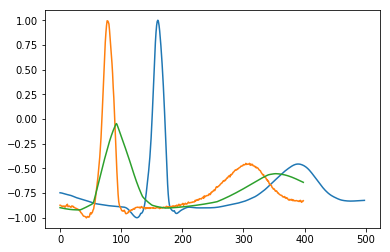

Iter: 870, running avg elbo: -621908.4720


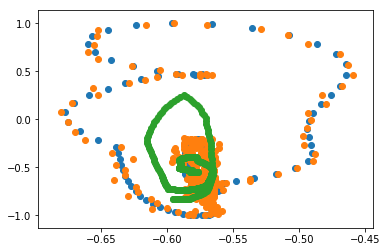

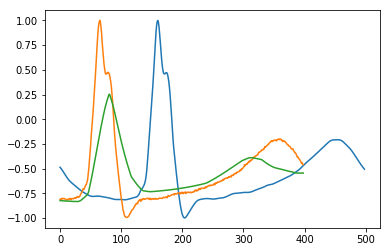

Iter: 880, running avg elbo: -619953.2941


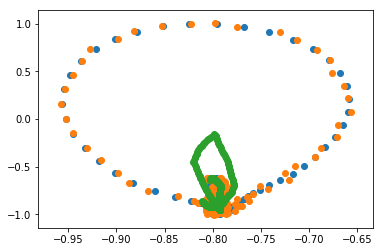

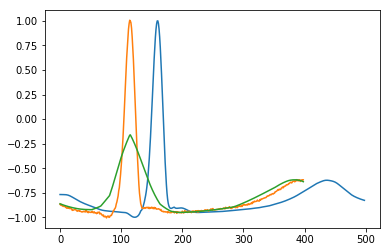

Iter: 890, running avg elbo: -617474.3715


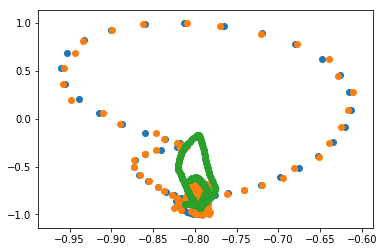

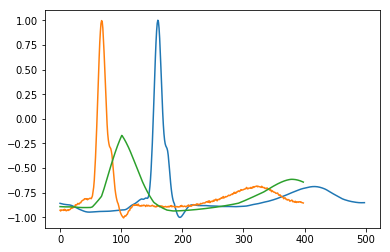

Iter: 900, running avg elbo: -615279.7852


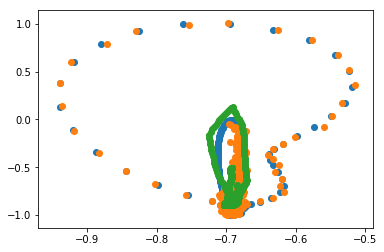

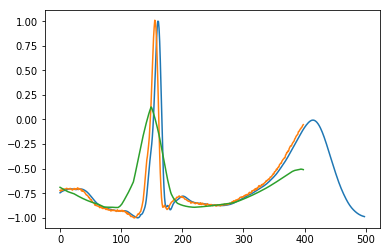

Iter: 910, running avg elbo: -617709.0243


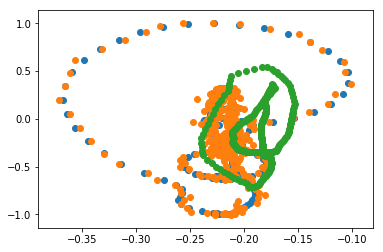

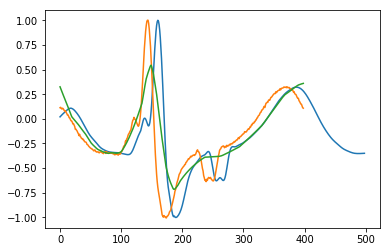

Iter: 920, running avg elbo: -616379.9702


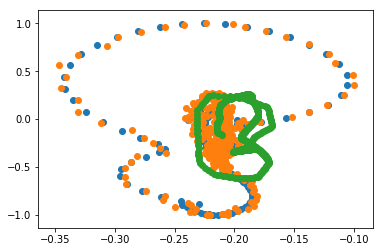

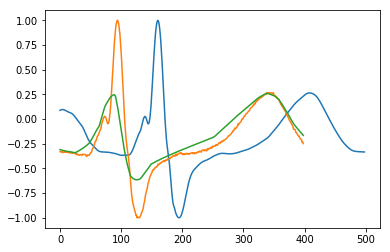

Iter: 930, running avg elbo: -613977.0318


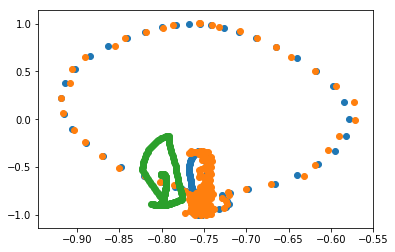

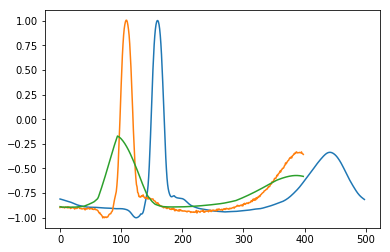

Iter: 940, running avg elbo: -613878.6657


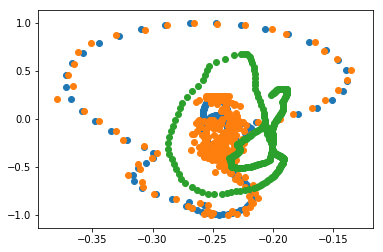

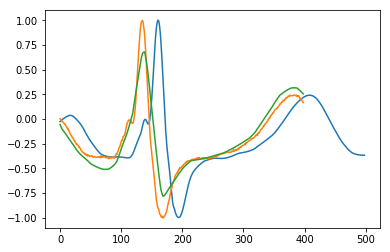

Iter: 950, running avg elbo: -613590.0117


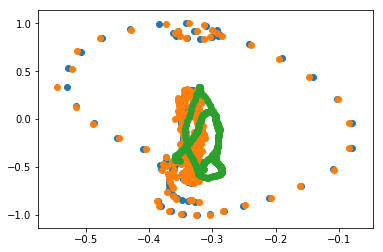

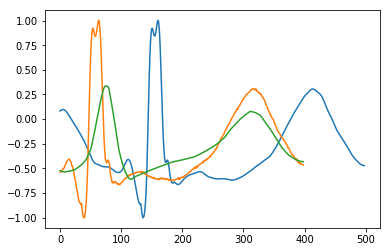

Iter: 960, running avg elbo: -610988.3690


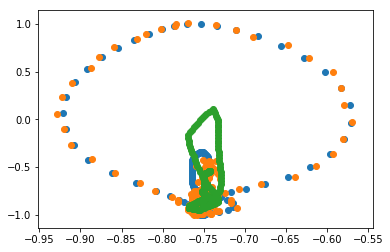

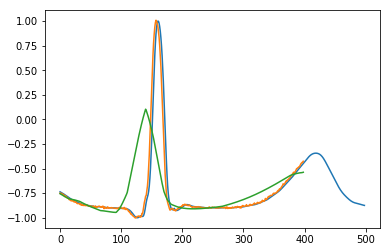

Iter: 970, running avg elbo: -615783.2300


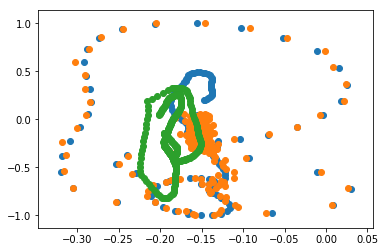

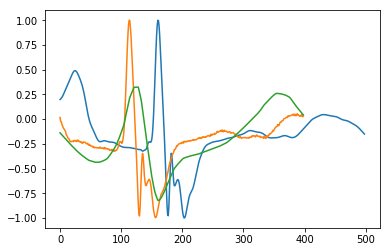

Iter: 980, running avg elbo: -618746.6700


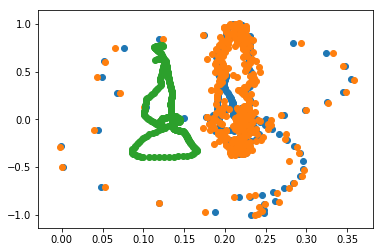

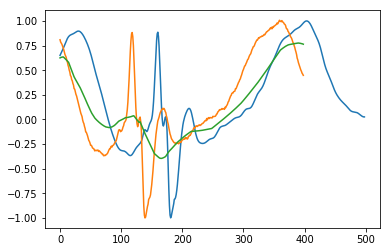

Iter: 990, running avg elbo: -620906.4279


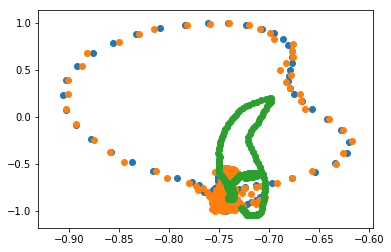

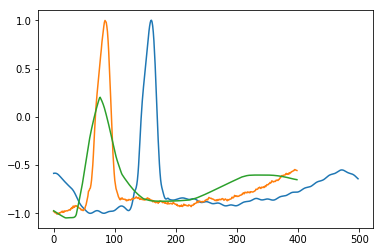

Iter: 1000, running avg elbo: -619661.5293


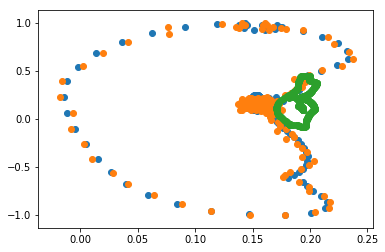

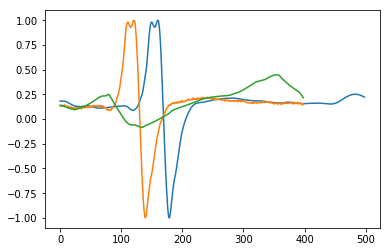

Iter: 1010, running avg elbo: -617062.0200


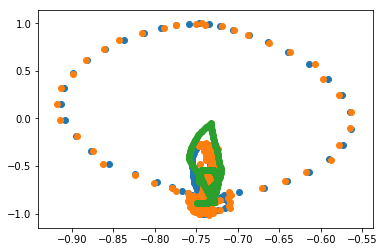

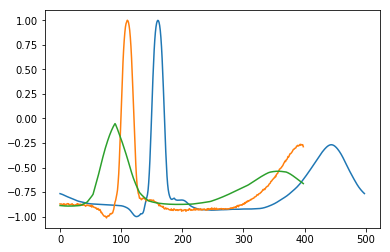

Iter: 1020, running avg elbo: -613775.1843


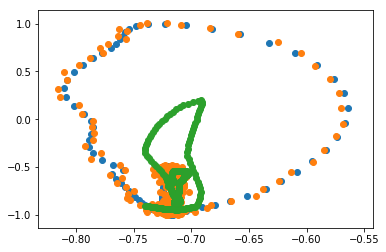

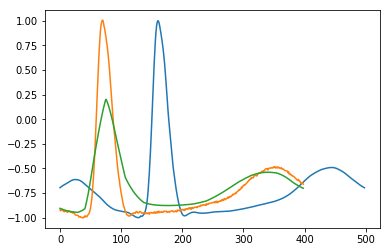

Iter: 1030, running avg elbo: -612418.1926


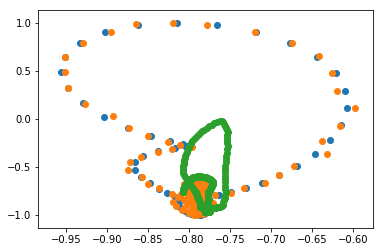

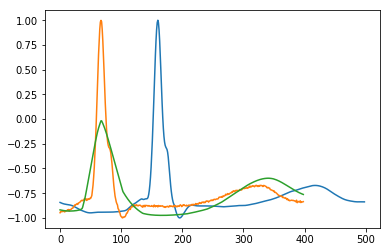

Iter: 1040, running avg elbo: -614528.5995


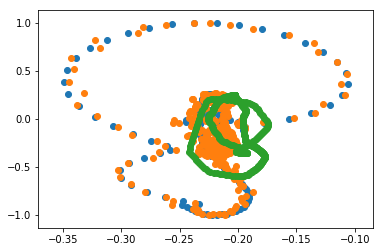

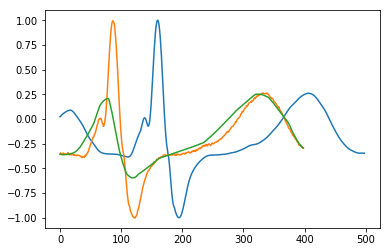

Iter: 1050, running avg elbo: -614150.2187


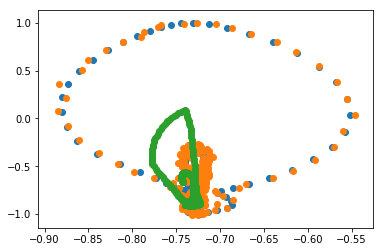

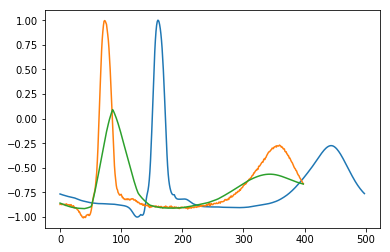

Iter: 1060, running avg elbo: -610999.2820


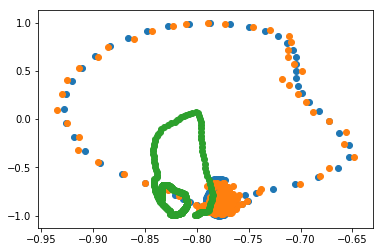

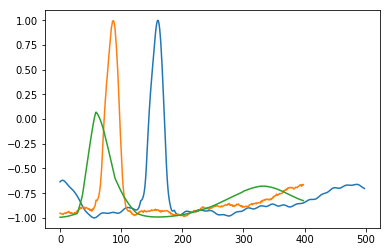

Iter: 1070, running avg elbo: -608194.0368


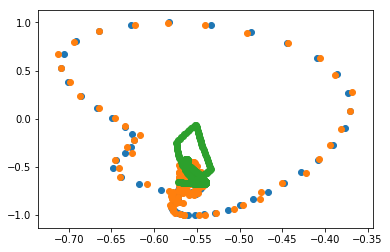

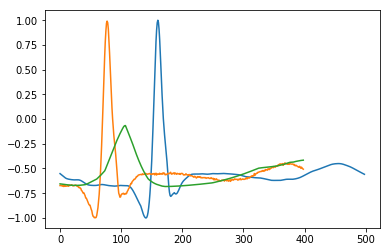

Iter: 1080, running avg elbo: -607561.8418


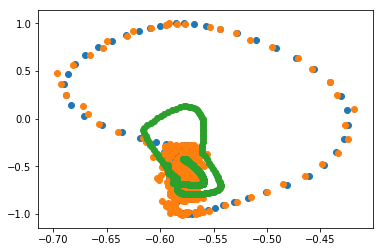

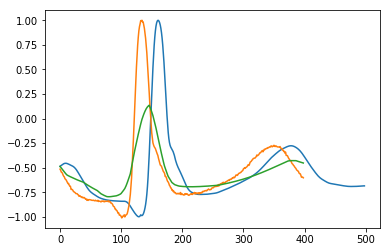

Iter: 1090, running avg elbo: -606997.7175


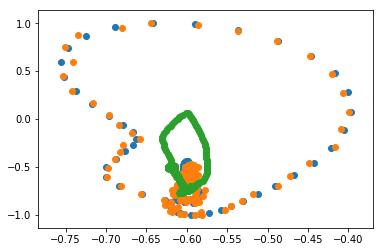

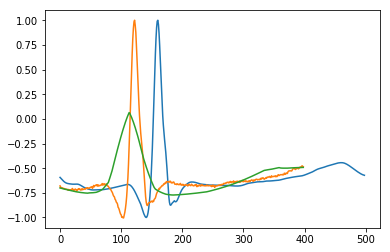

Iter: 1100, running avg elbo: -603495.9499


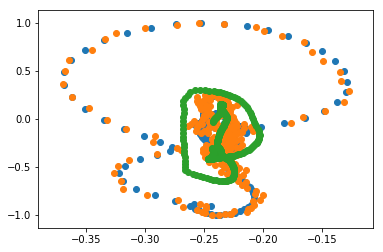

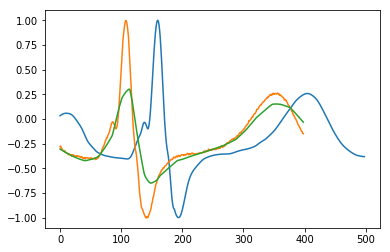

Iter: 1110, running avg elbo: -599874.5578


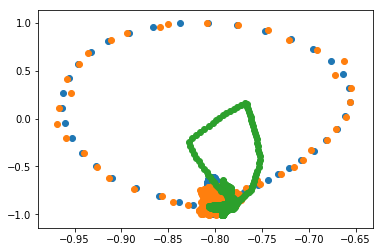

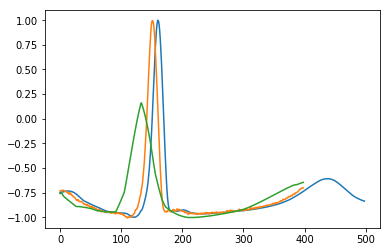

Iter: 1120, running avg elbo: -596789.0788


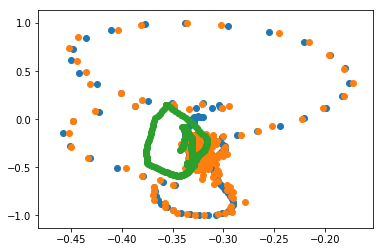

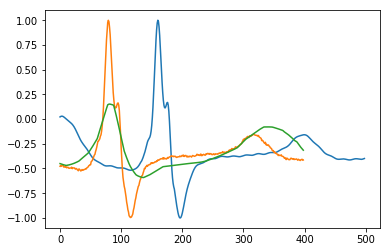

Iter: 1130, running avg elbo: -594322.0972


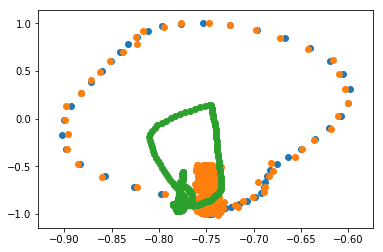

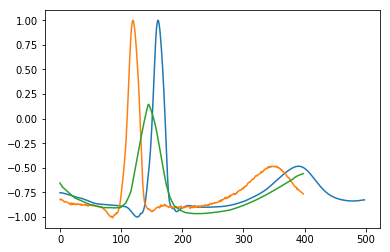

Iter: 1140, running avg elbo: -596840.4592


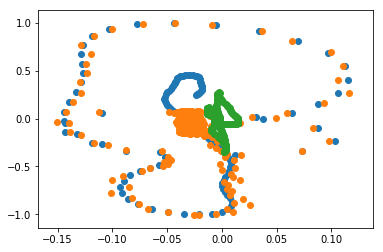

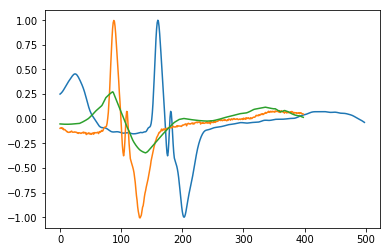

Iter: 1150, running avg elbo: -598523.3253


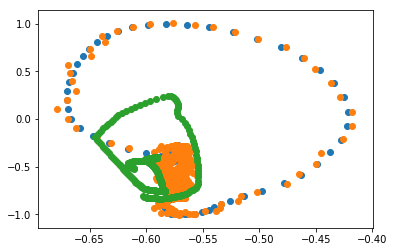

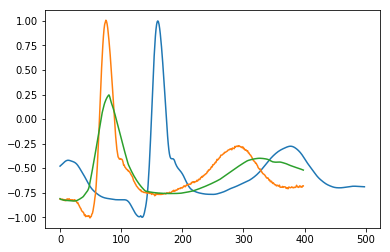

Iter: 1160, running avg elbo: -601975.0895


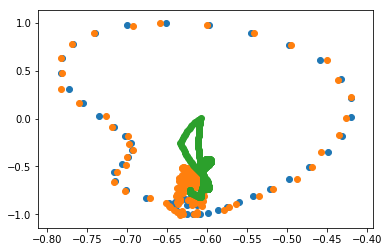

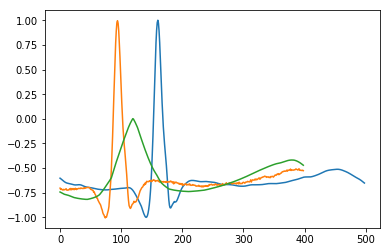

Iter: 1170, running avg elbo: -602802.6084


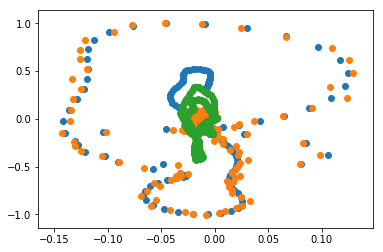

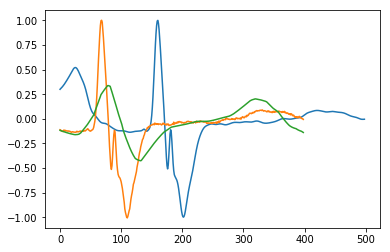

Iter: 1180, running avg elbo: -600702.8546


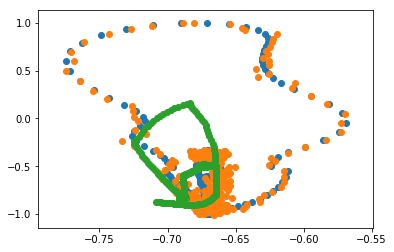

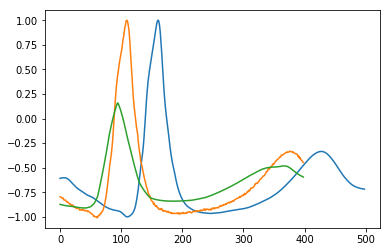

Iter: 1190, running avg elbo: -598634.7193


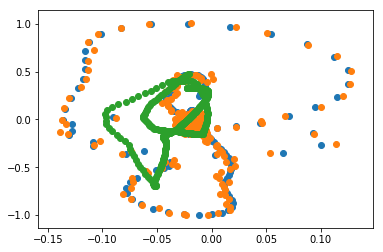

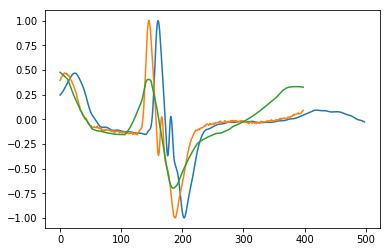

Iter: 1200, running avg elbo: -598783.0465


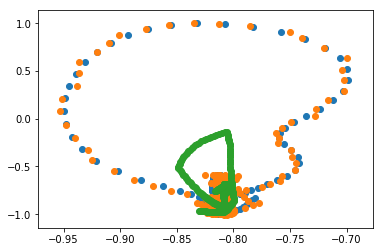

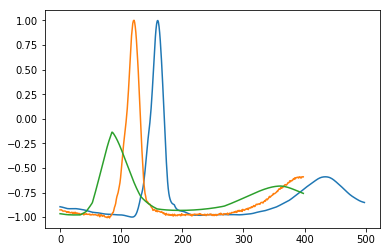

Iter: 1210, running avg elbo: -602136.3128


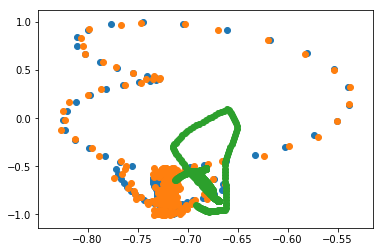

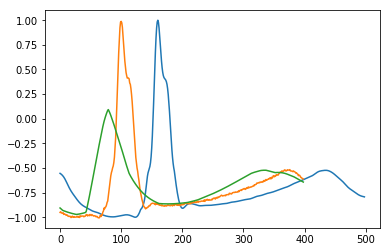

Iter: 1220, running avg elbo: -600161.2747


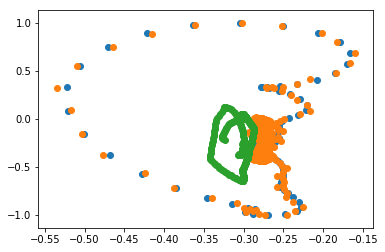

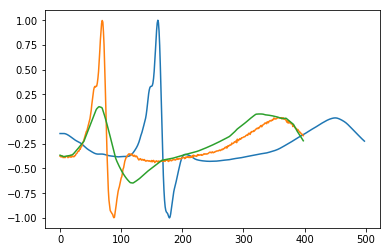

Iter: 1230, running avg elbo: -606274.7314


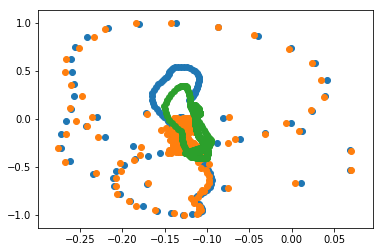

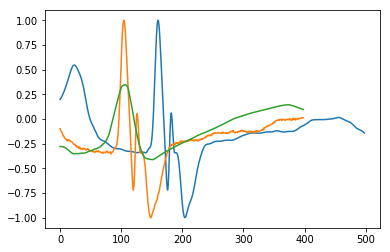

Iter: 1240, running avg elbo: -609880.4244


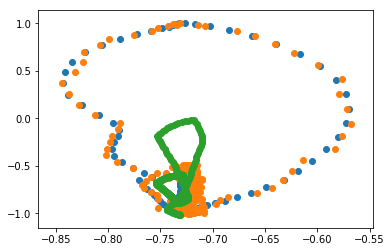

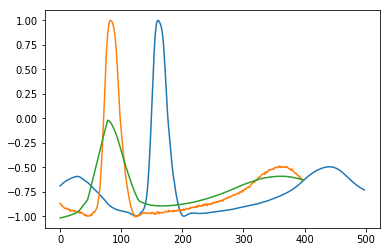

Iter: 1250, running avg elbo: -608871.4303


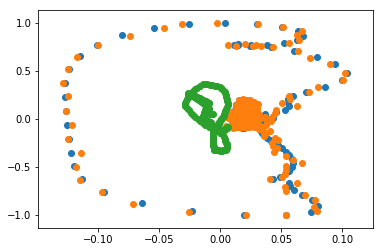

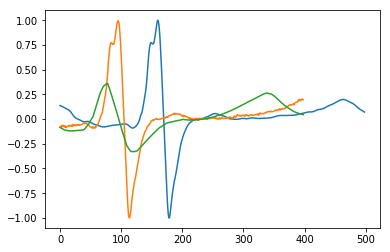

Iter: 1260, running avg elbo: -604706.5954


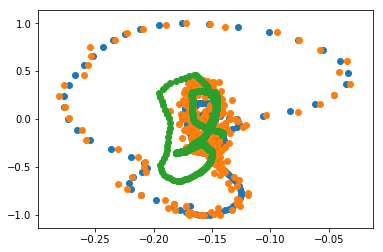

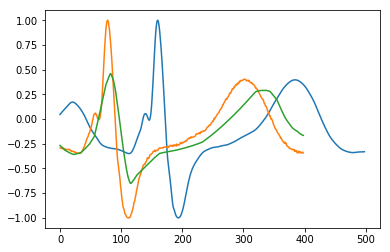

Iter: 1270, running avg elbo: -604070.9264


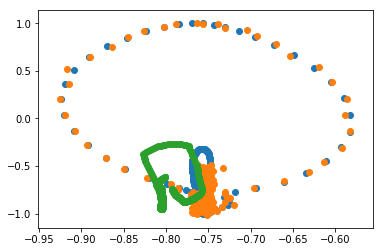

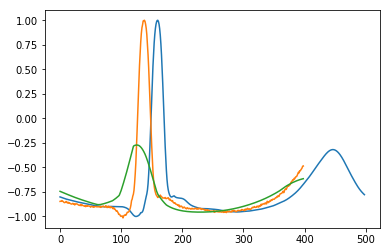

Iter: 1280, running avg elbo: -605814.0334


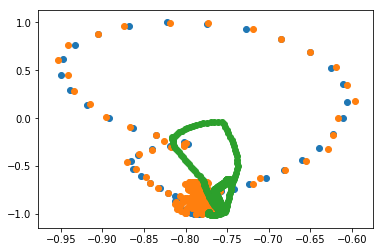

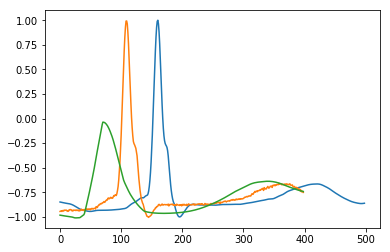

Iter: 1290, running avg elbo: -603479.2563


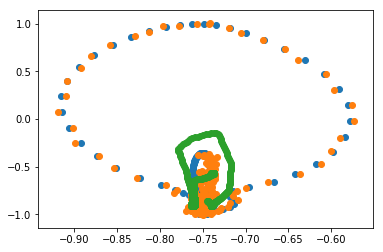

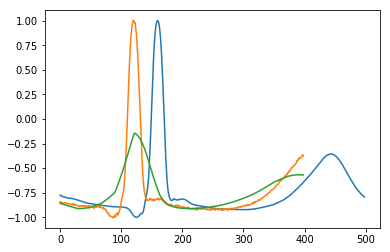

Iter: 1300, running avg elbo: -601018.0772


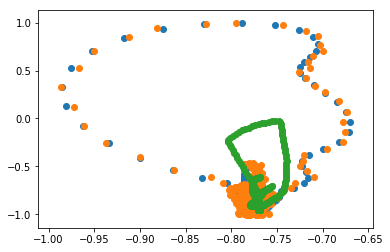

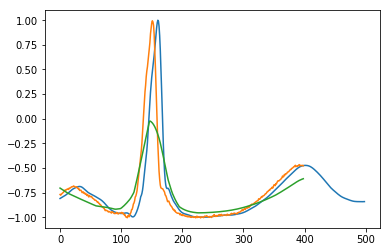

Iter: 1310, running avg elbo: -598083.9150


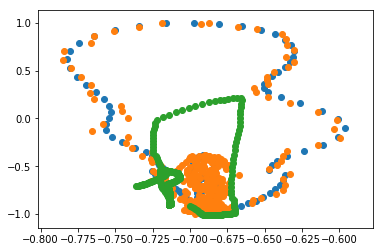

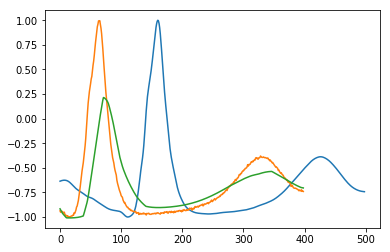

Iter: 1320, running avg elbo: -593290.2208


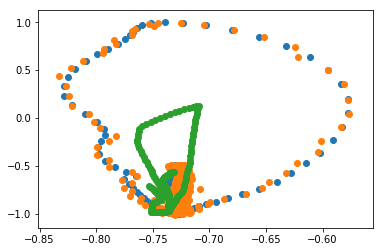

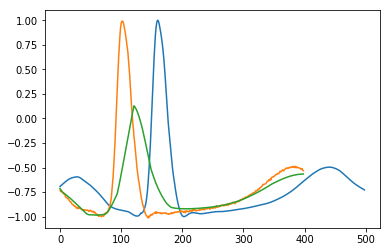

Iter: 1330, running avg elbo: -590226.9539


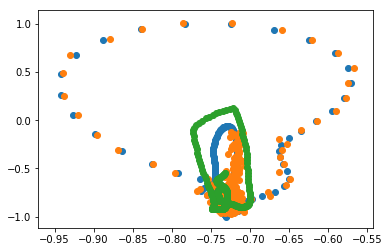

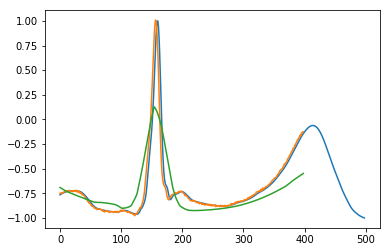

Iter: 1340, running avg elbo: -584109.1162


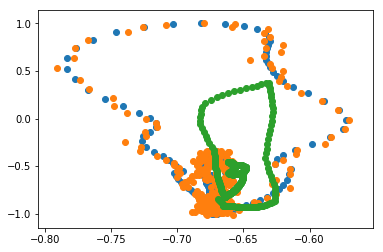

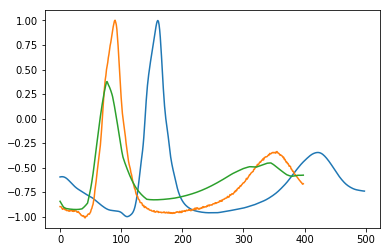

Iter: 1350, running avg elbo: -583050.8745


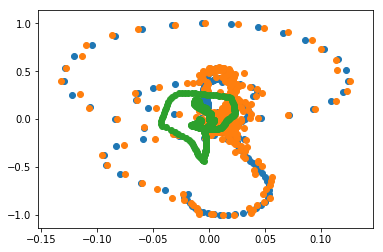

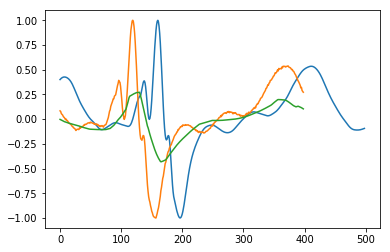

Iter: 1360, running avg elbo: -579318.1425


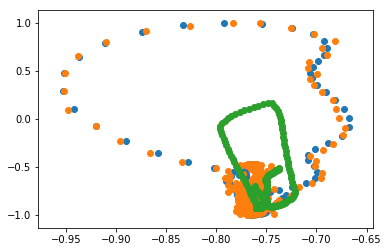

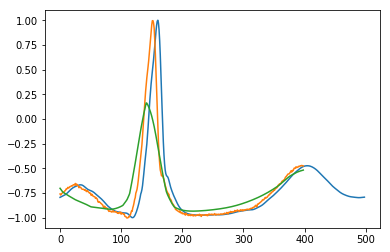

Iter: 1370, running avg elbo: -574218.8770


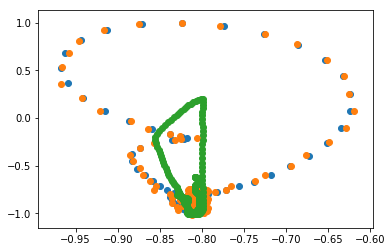

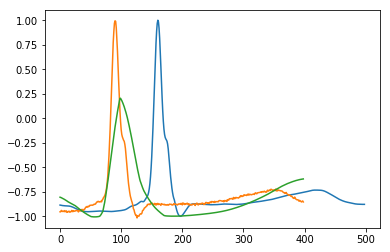

Iter: 1380, running avg elbo: -573550.2266


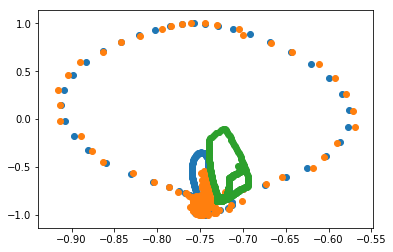

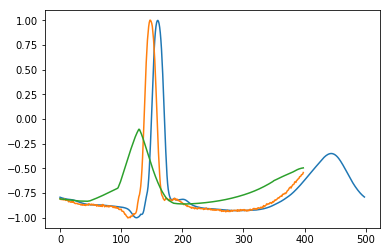

Iter: 1390, running avg elbo: -571313.6919


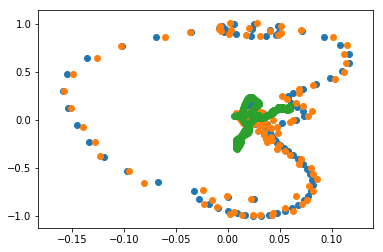

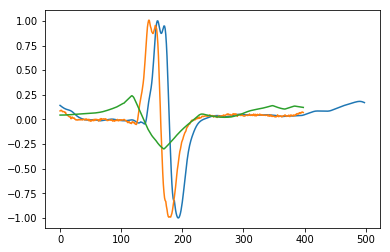

Iter: 1400, running avg elbo: -570197.7445


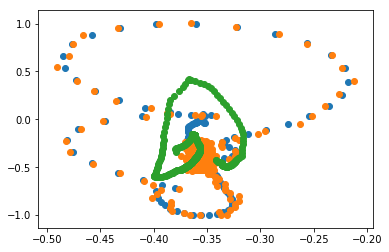

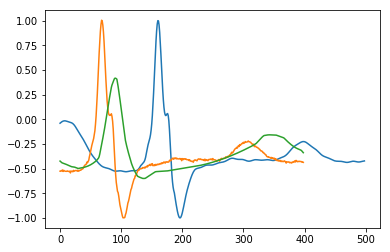

Iter: 1410, running avg elbo: -568328.6096


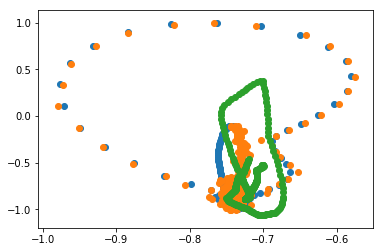

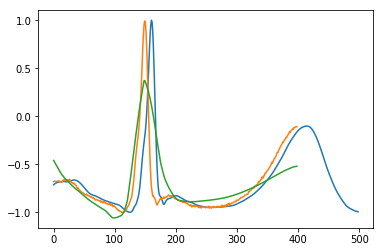

Iter: 1420, running avg elbo: -571944.6516


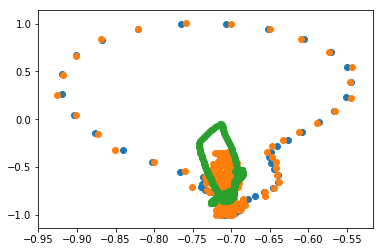

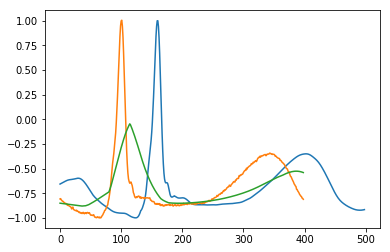

Iter: 1430, running avg elbo: -571795.7255


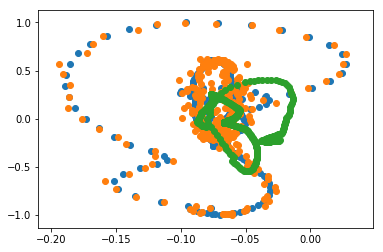

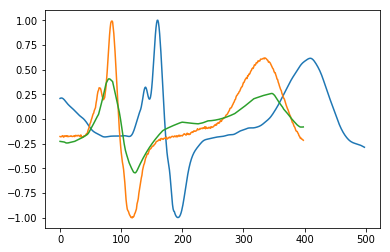

Iter: 1440, running avg elbo: -578625.4586


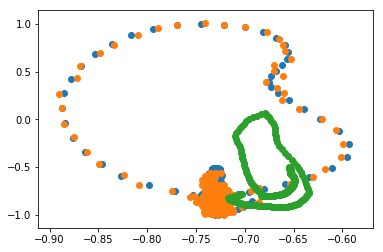

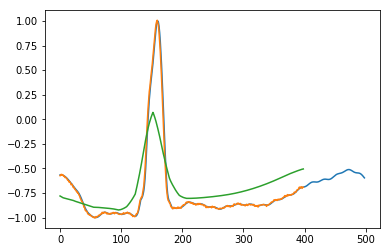

Iter: 1450, running avg elbo: -588717.7594


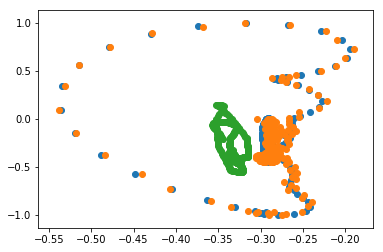

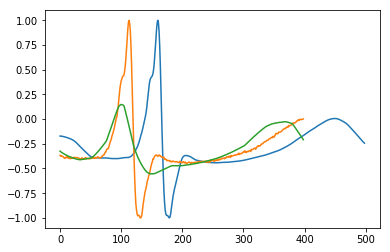

Iter: 1460, running avg elbo: -592873.3786


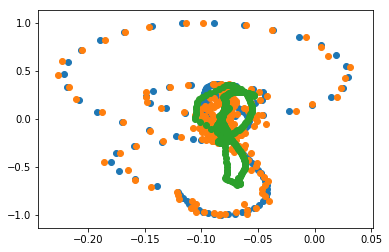

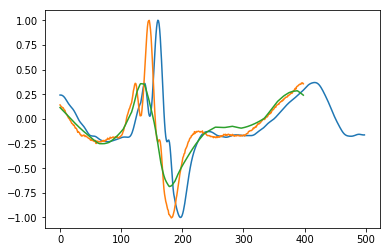

Iter: 1470, running avg elbo: -593985.2451


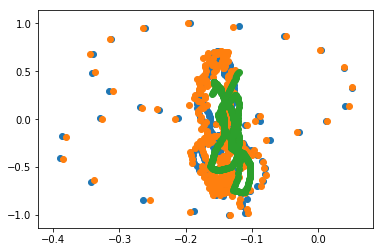

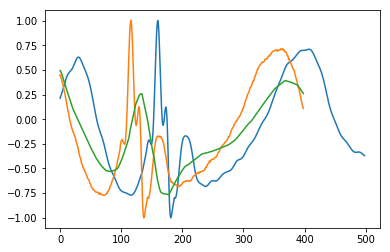

Iter: 1480, running avg elbo: -595250.1319


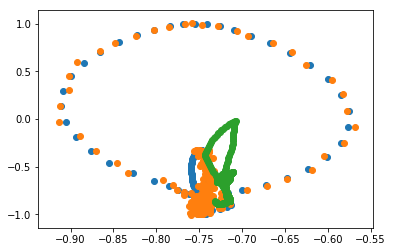

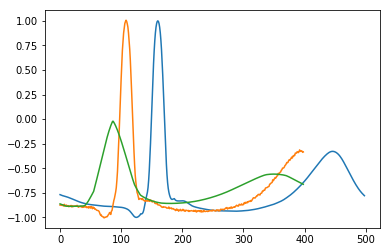

Iter: 1490, running avg elbo: -596062.5593


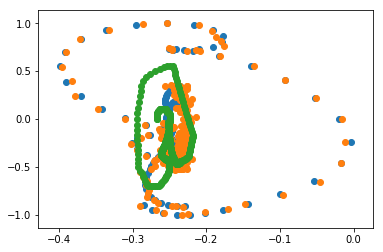

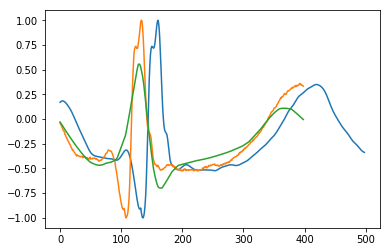

Iter: 1500, running avg elbo: -596118.2192


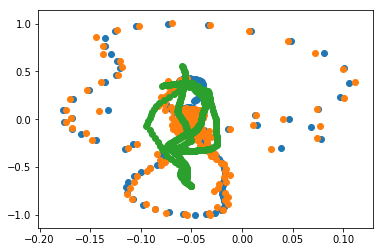

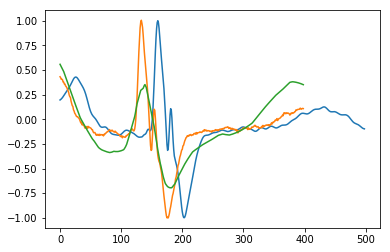

Iter: 1510, running avg elbo: -596308.5907


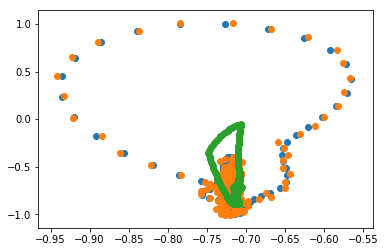

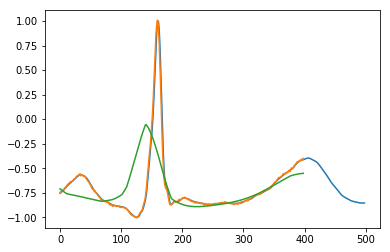

Iter: 1520, running avg elbo: -596025.3120


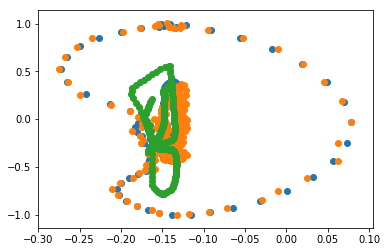

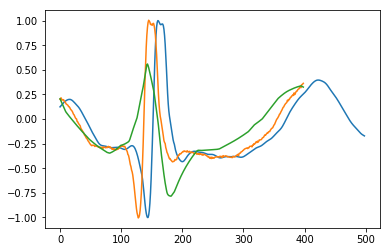

Iter: 1530, running avg elbo: -593839.1454


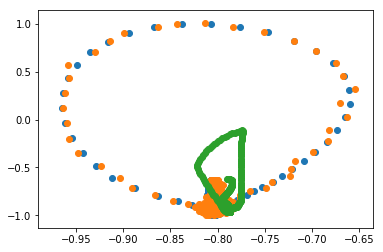

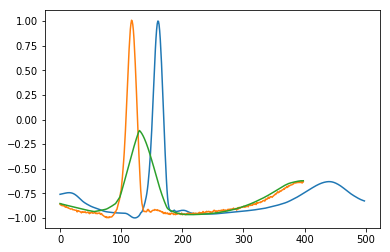

Iter: 1540, running avg elbo: -590358.7847


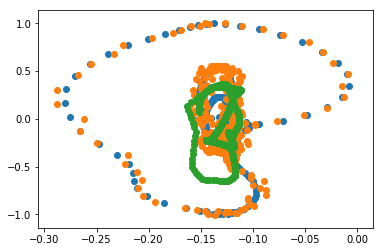

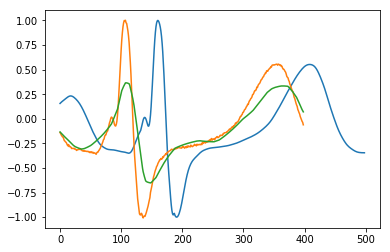

Iter: 1550, running avg elbo: -586150.5130


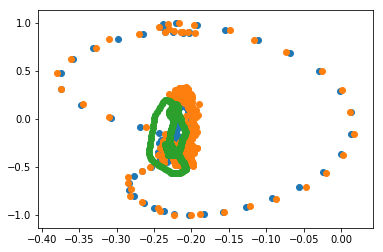

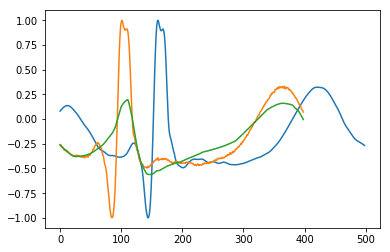

Iter: 1560, running avg elbo: -591665.1043


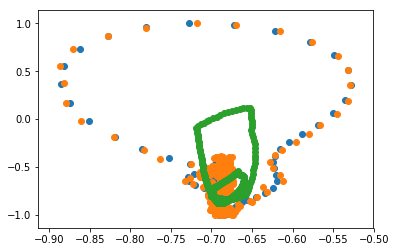

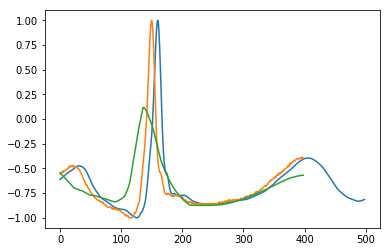

Iter: 1570, running avg elbo: -592788.6189


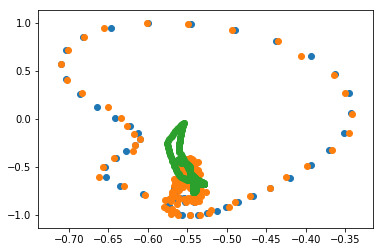

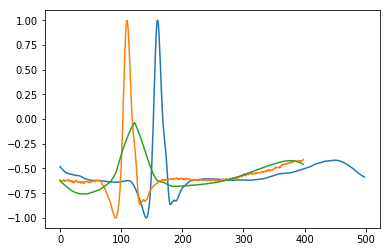

Iter: 1580, running avg elbo: -591144.7823


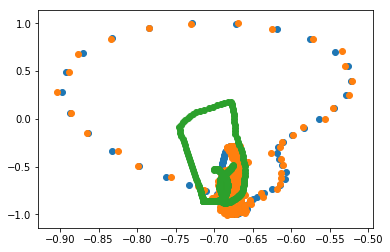

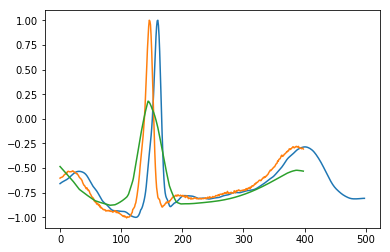

Iter: 1590, running avg elbo: -587847.0289


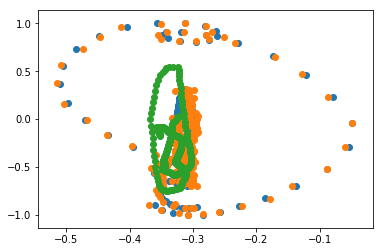

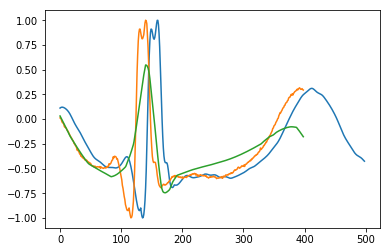

Iter: 1600, running avg elbo: -583536.4553


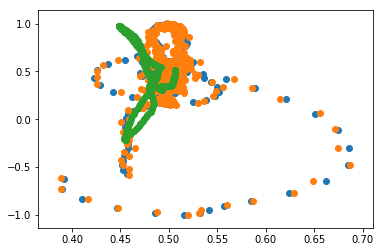

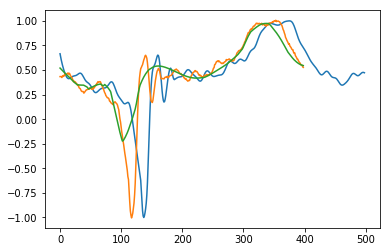

Iter: 1610, running avg elbo: -583359.0485


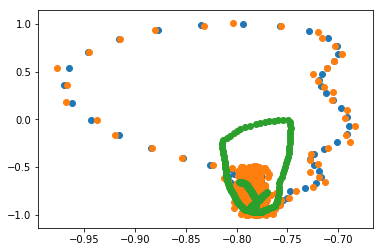

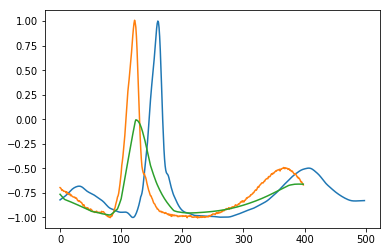

Iter: 1620, running avg elbo: -583150.8086


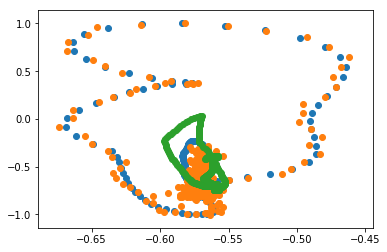

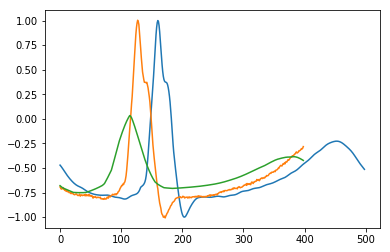

Iter: 1630, running avg elbo: -581310.1393


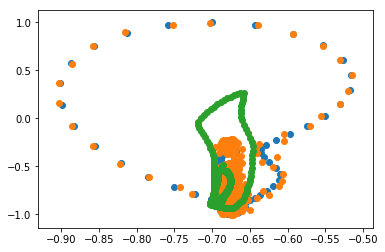

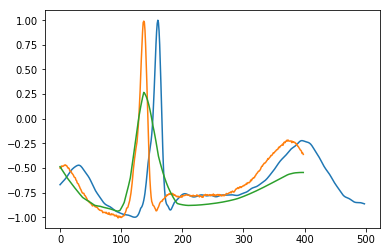

Iter: 1640, running avg elbo: -577828.7107


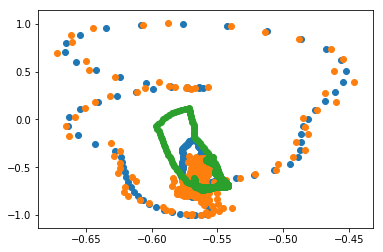

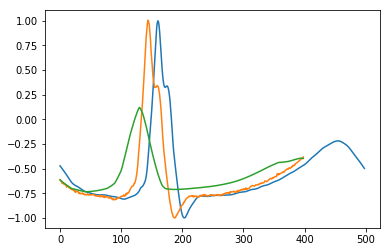

Iter: 1650, running avg elbo: -573653.4326


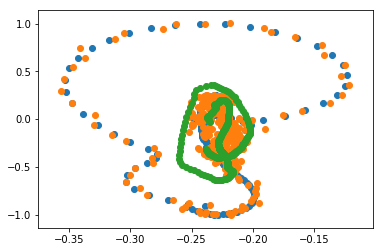

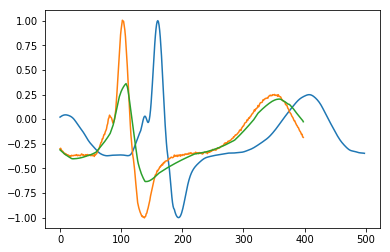

Iter: 1660, running avg elbo: -572420.1497


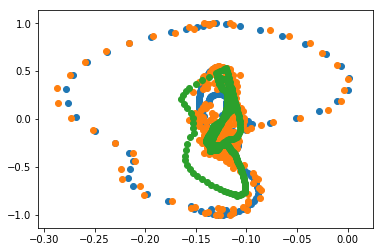

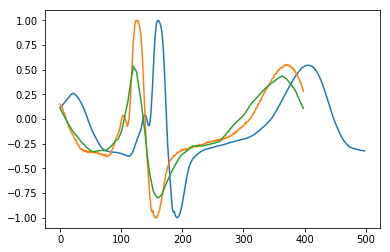

Iter: 1670, running avg elbo: -569961.6018


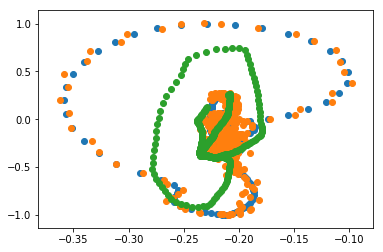

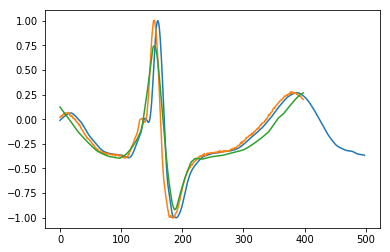

Iter: 1680, running avg elbo: -568108.1180


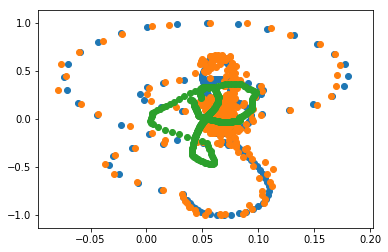

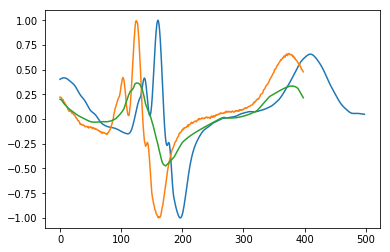

Iter: 1690, running avg elbo: -568839.3712


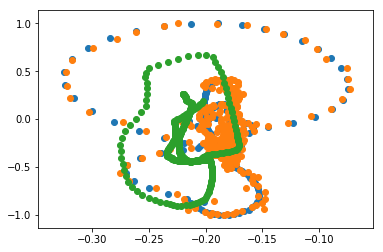

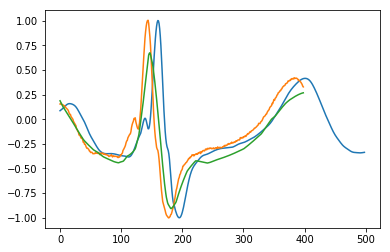

Iter: 1700, running avg elbo: -566557.5098


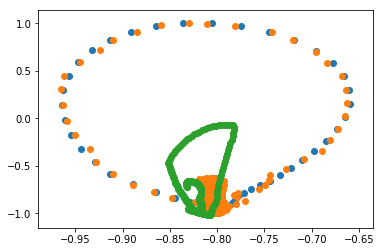

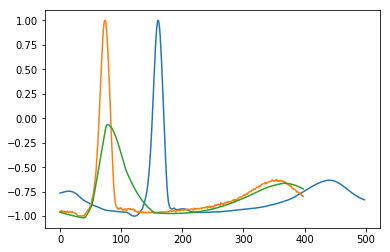

Iter: 1710, running avg elbo: -564013.5435


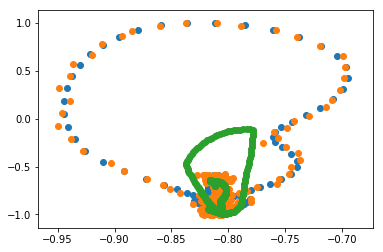

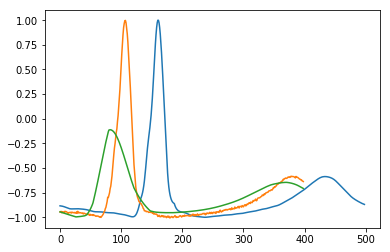

Iter: 1720, running avg elbo: -561826.9621


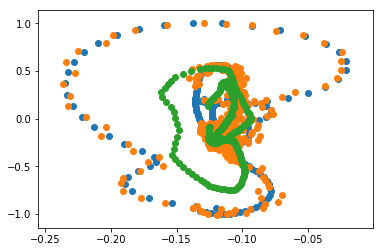

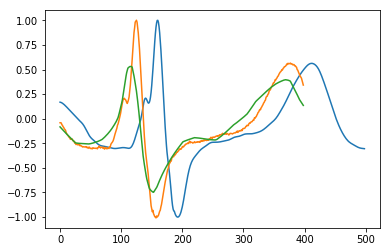

Iter: 1730, running avg elbo: -559017.7845


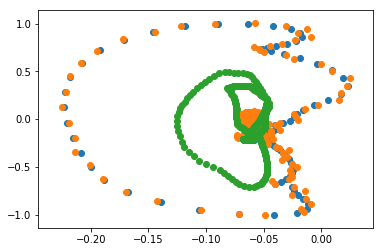

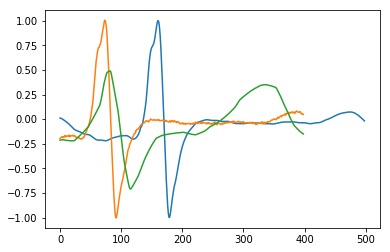

Iter: 1740, running avg elbo: -557422.7791


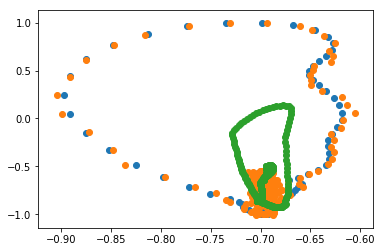

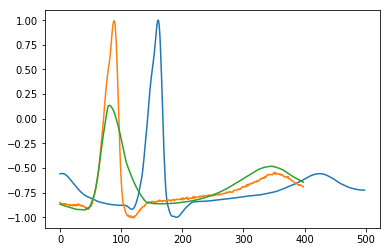

Iter: 1750, running avg elbo: -555424.4969


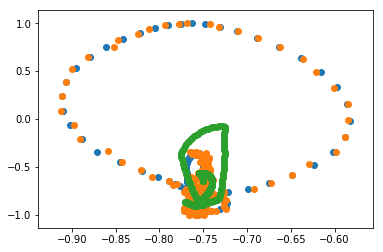

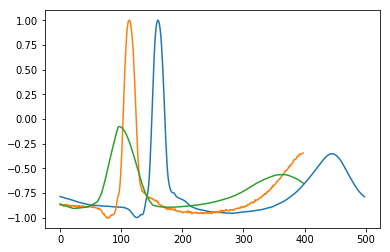

Iter: 1760, running avg elbo: -553543.7359


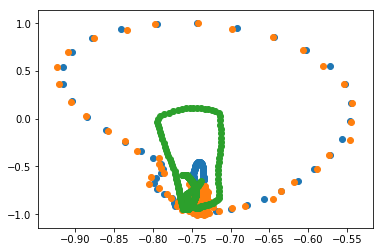

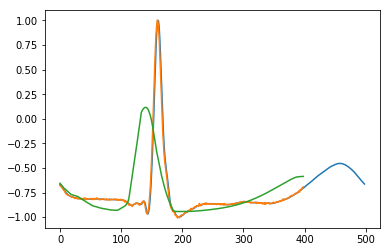

Iter: 1770, running avg elbo: -552557.3053


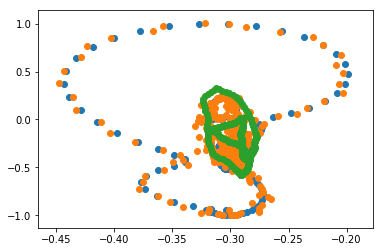

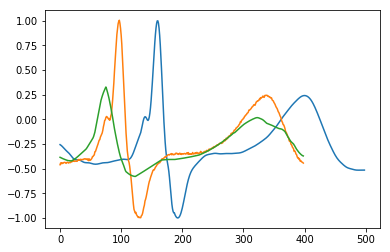

Iter: 1780, running avg elbo: -551785.1885


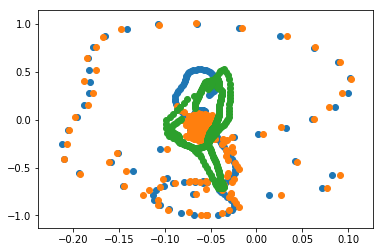

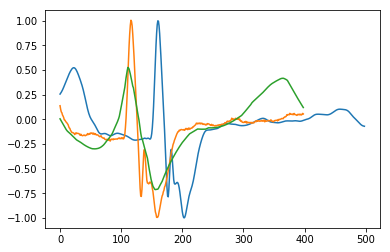

Iter: 1790, running avg elbo: -552385.2627


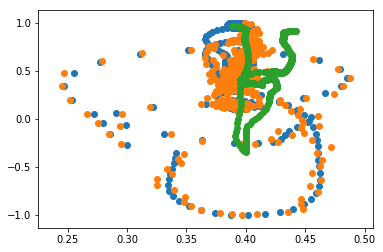

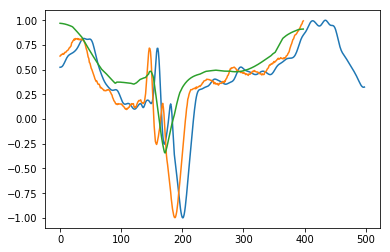

Iter: 1800, running avg elbo: -551875.9356


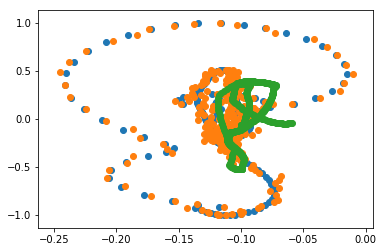

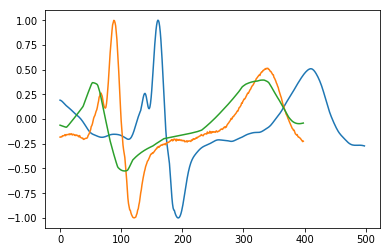

Iter: 1810, running avg elbo: -549574.0562


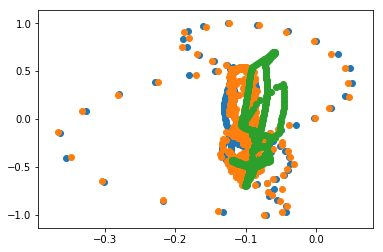

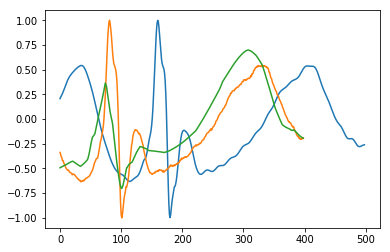

Iter: 1820, running avg elbo: -548935.7908


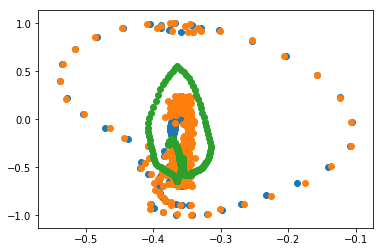

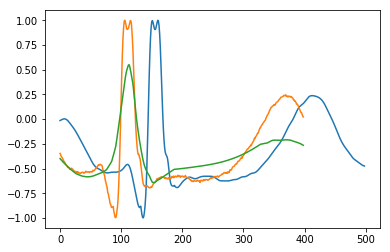

Iter: 1830, running avg elbo: -546401.1169


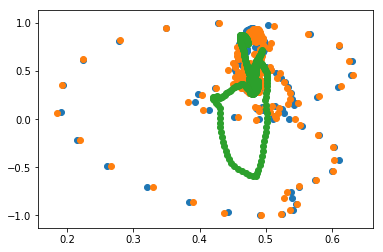

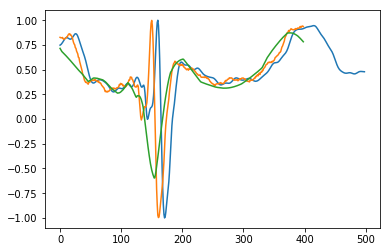

Iter: 1840, running avg elbo: -544685.5468


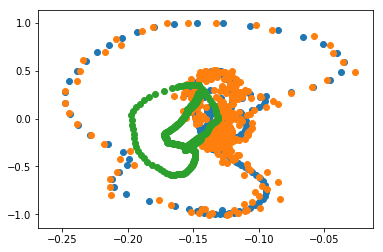

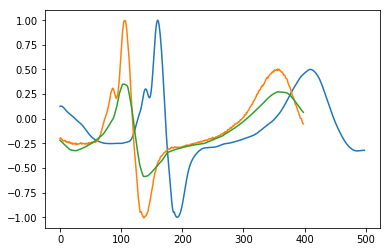

Iter: 1850, running avg elbo: -542177.3726


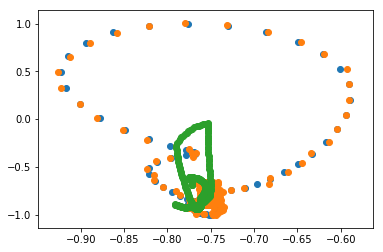

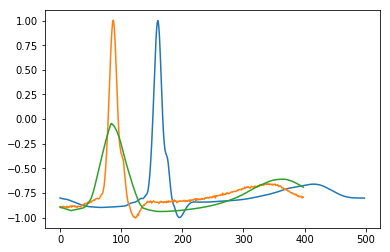

Iter: 1860, running avg elbo: -543446.9711


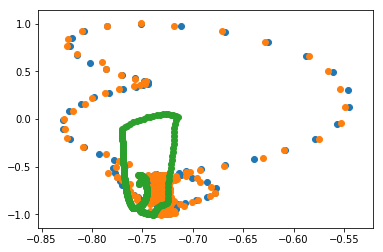

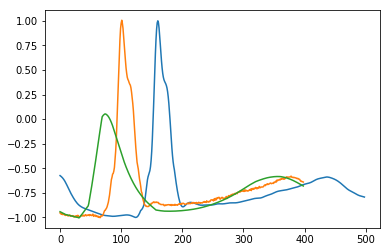

Iter: 1870, running avg elbo: -542051.6617


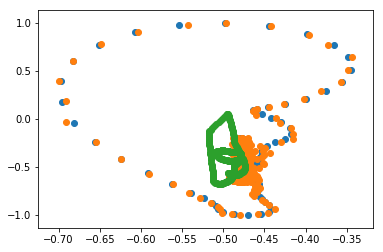

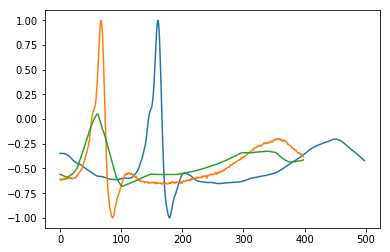

Iter: 1880, running avg elbo: -540306.6071


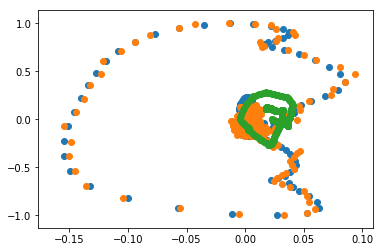

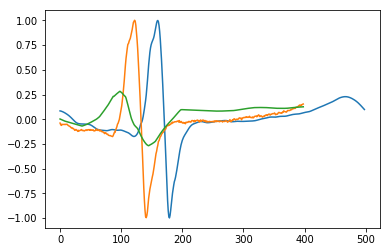

Iter: 1890, running avg elbo: -539434.8228


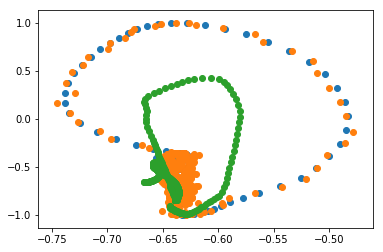

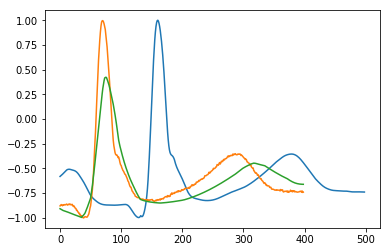

Iter: 1900, running avg elbo: -538328.9190


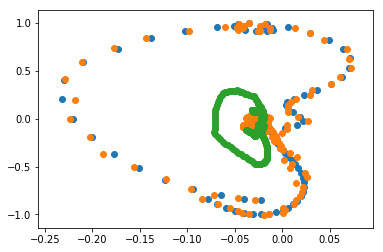

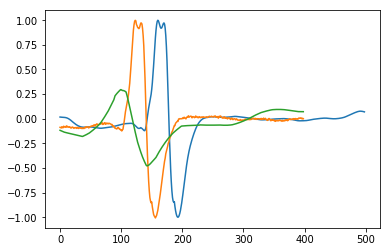

Iter: 1910, running avg elbo: -537523.6621


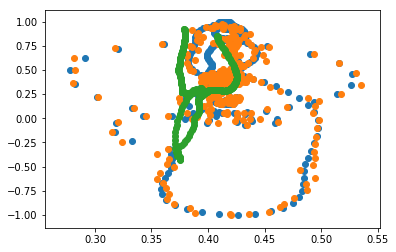

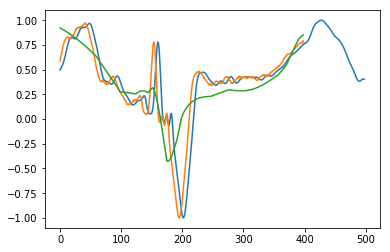

Iter: 1920, running avg elbo: -537851.7923


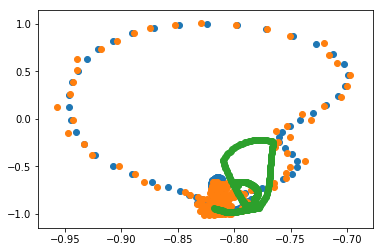

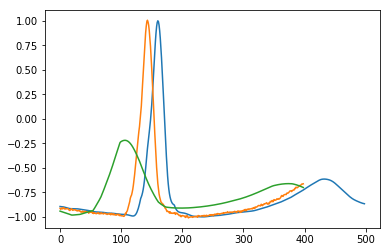

Iter: 1930, running avg elbo: -536013.1997


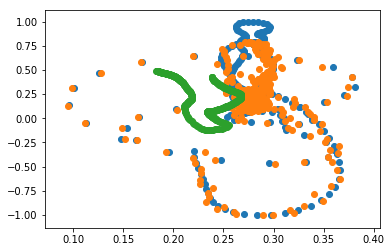

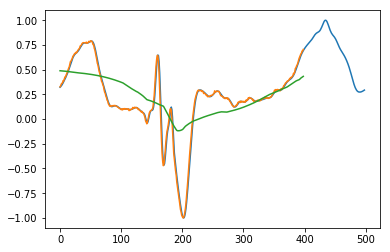

Iter: 1940, running avg elbo: -534293.3849


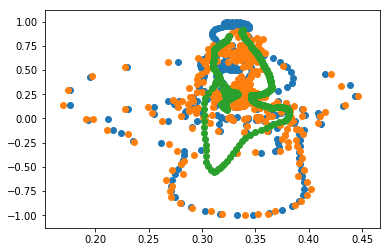

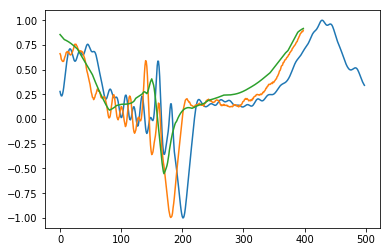

Iter: 1950, running avg elbo: -535243.7915


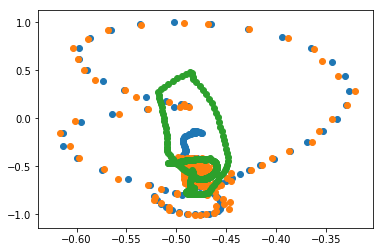

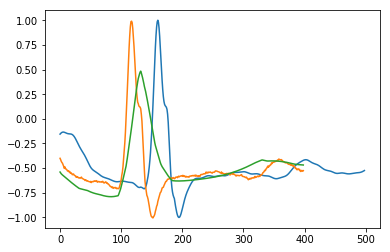

Iter: 1960, running avg elbo: -535616.6807


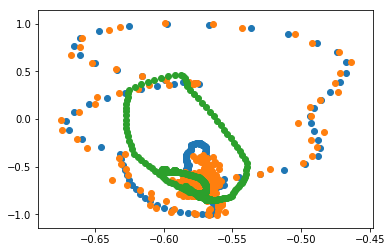

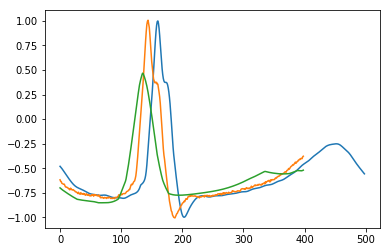

Iter: 1970, running avg elbo: -538498.1518


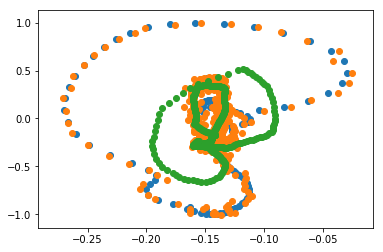

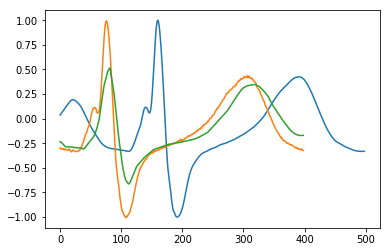

Iter: 1980, running avg elbo: -550116.7693


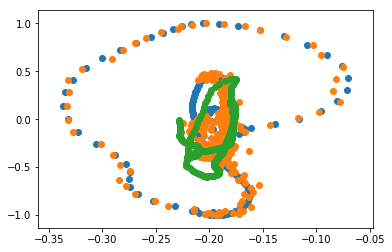

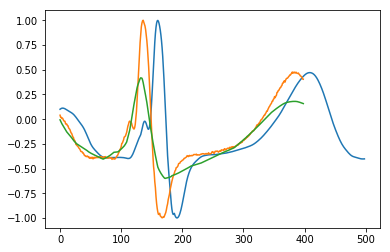

Iter: 1990, running avg elbo: -555380.4288


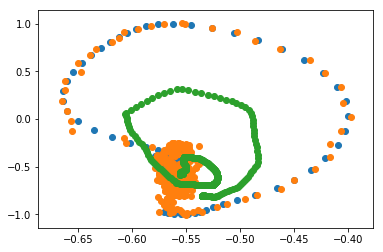

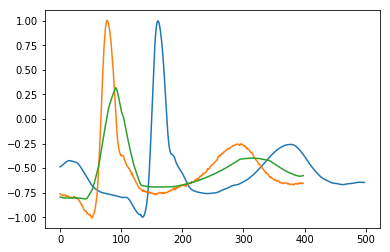

Iter: 2000, running avg elbo: -557517.5775


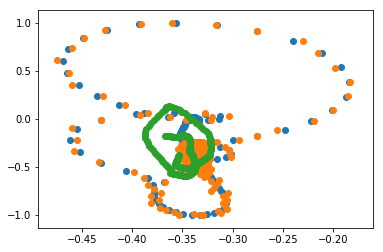

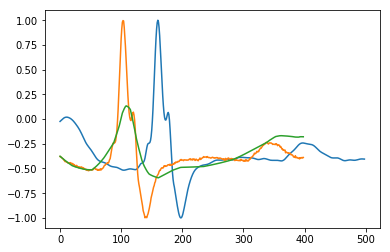

Iter: 2010, running avg elbo: -557520.5339


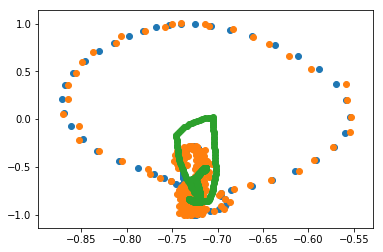

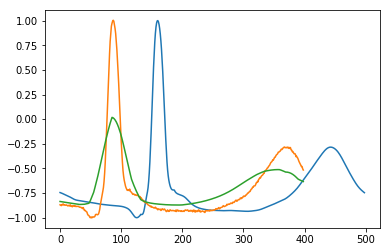

Iter: 2020, running avg elbo: -556061.1341


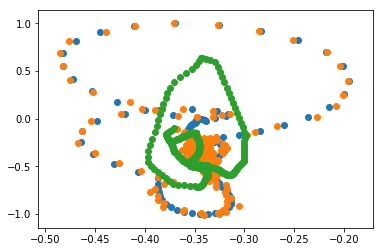

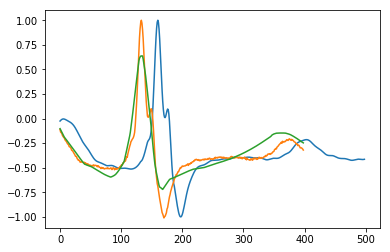

Iter: 2030, running avg elbo: -553578.3604


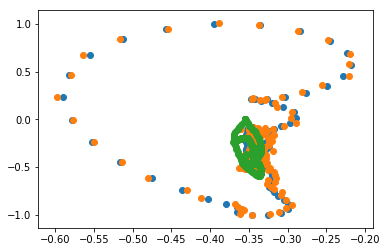

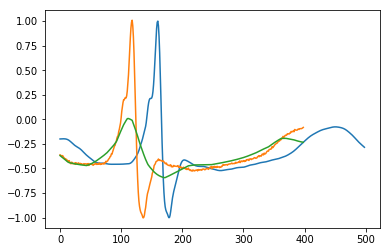

Iter: 2040, running avg elbo: -550395.1666


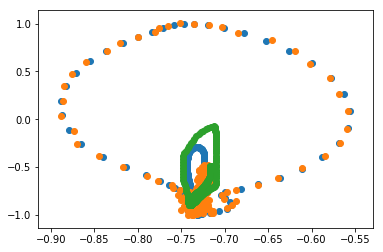

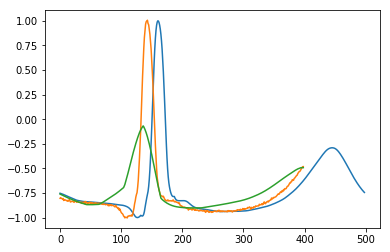

Iter: 2050, running avg elbo: -546788.5229


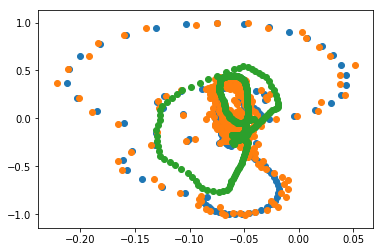

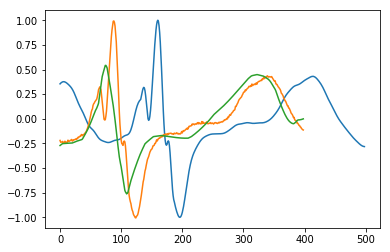

Iter: 2060, running avg elbo: -542906.0289


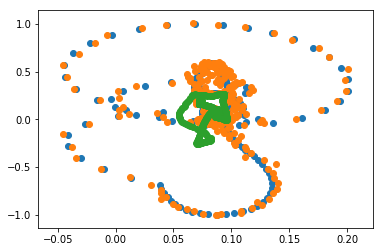

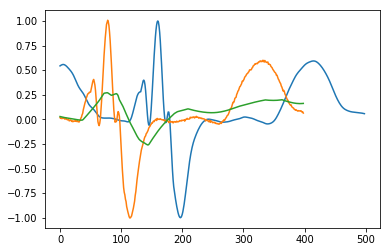

Iter: 2070, running avg elbo: -539731.0076


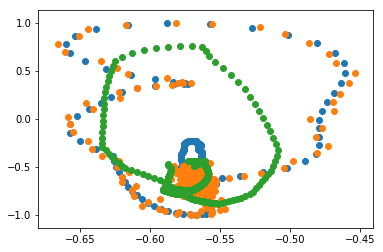

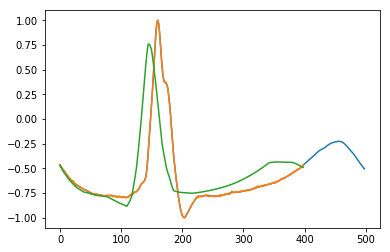

Iter: 2080, running avg elbo: -541767.6817


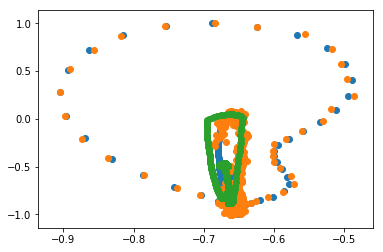

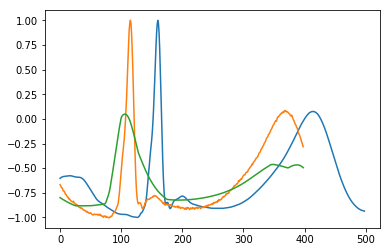

Iter: 2090, running avg elbo: -540454.3307


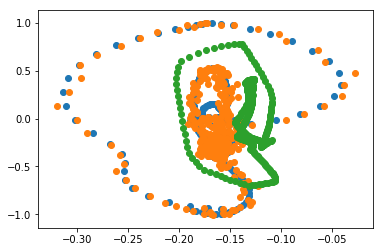

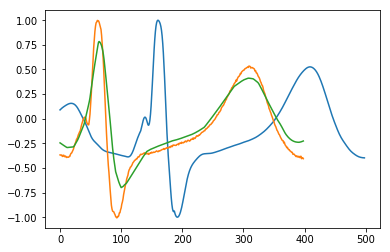

Iter: 2100, running avg elbo: -536707.2667


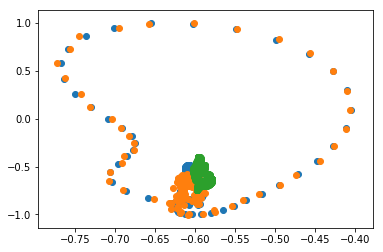

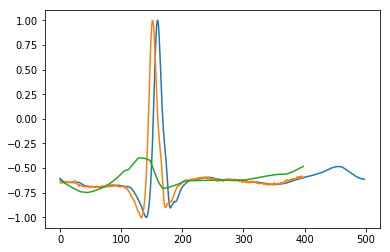

Iter: 2110, running avg elbo: -537334.5139


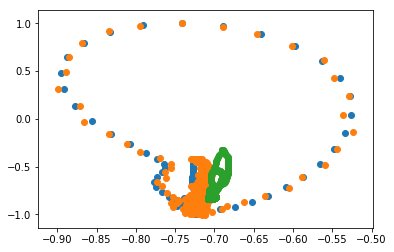

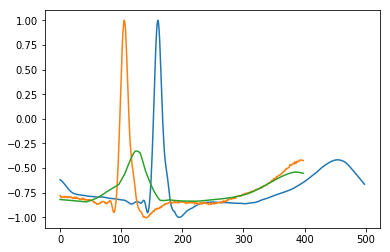

Iter: 2120, running avg elbo: -534117.6170


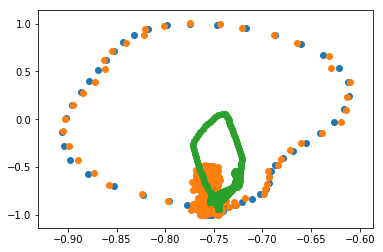

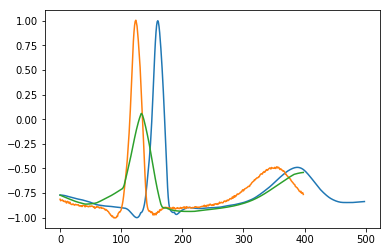

Iter: 2130, running avg elbo: -540561.8372


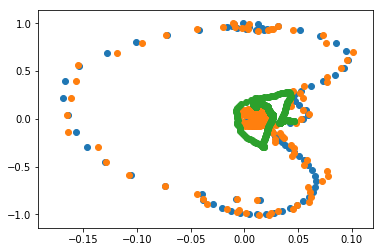

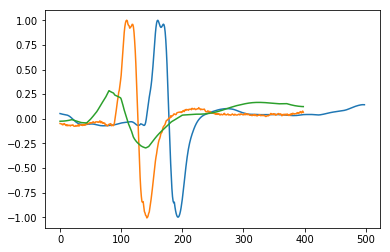

Iter: 2140, running avg elbo: -542823.4816


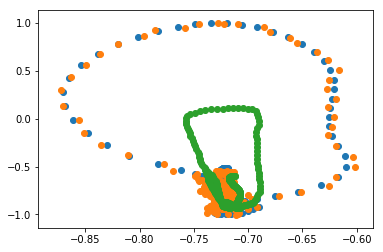

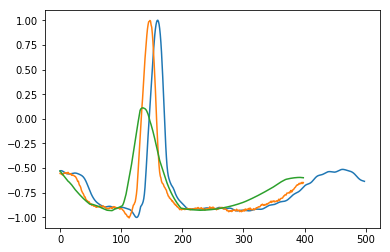

Iter: 2150, running avg elbo: -542061.9886


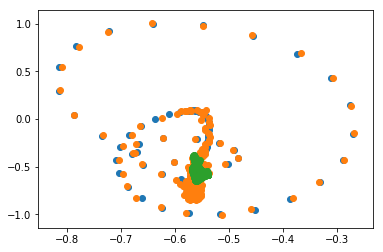

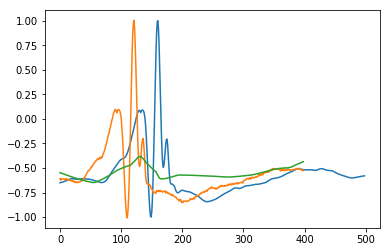

Iter: 2160, running avg elbo: -539819.7319


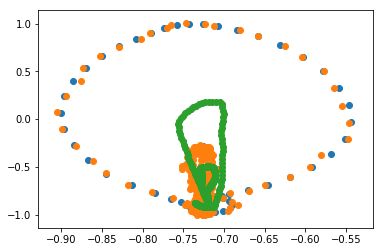

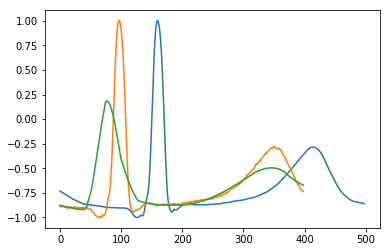

Iter: 2170, running avg elbo: -538482.4904


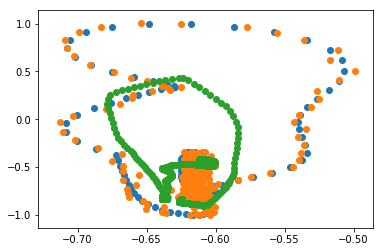

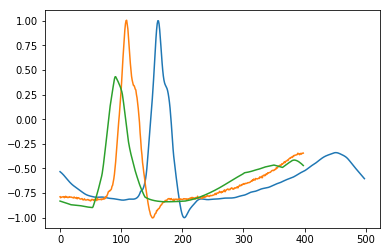

Iter: 2180, running avg elbo: -539688.0667


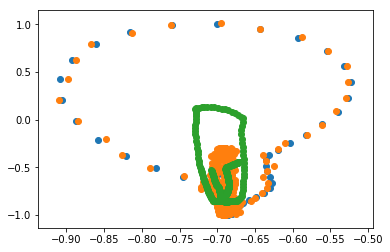

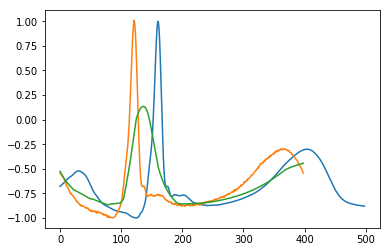

Iter: 2190, running avg elbo: -537513.7879


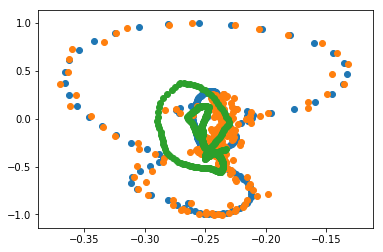

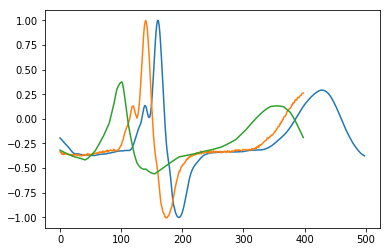

Iter: 2200, running avg elbo: -536641.8682


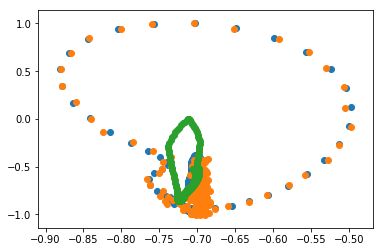

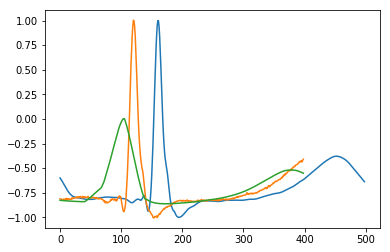

Iter: 2210, running avg elbo: -534617.7427


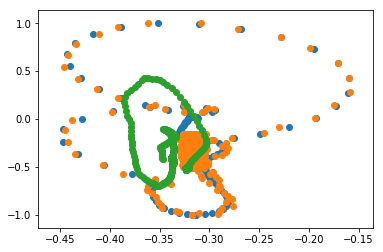

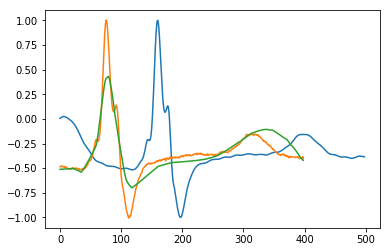

Iter: 2220, running avg elbo: -531561.3431


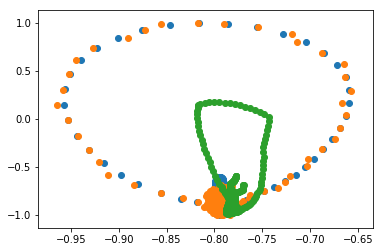

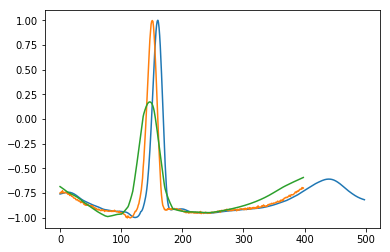

Iter: 2230, running avg elbo: -526962.3072


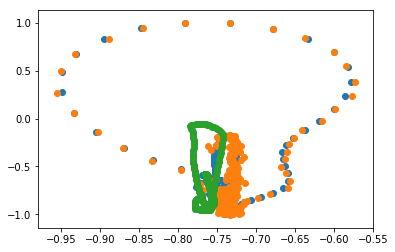

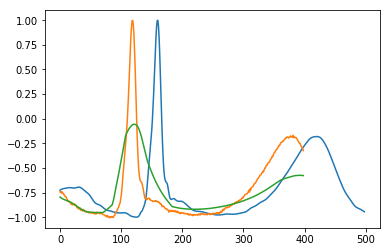

Iter: 2240, running avg elbo: -528030.5035


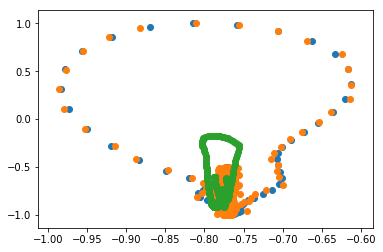

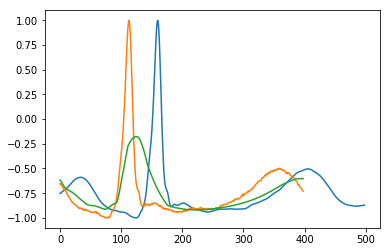

Iter: 2250, running avg elbo: -536273.8968


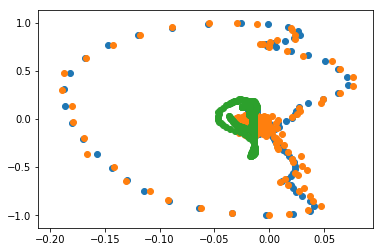

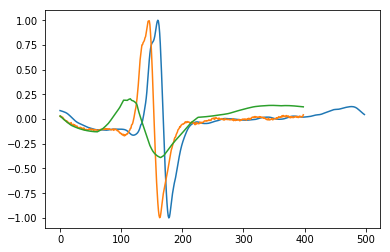

Iter: 2260, running avg elbo: -539166.7340


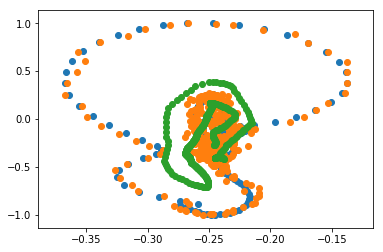

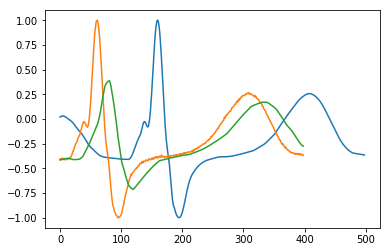

KeyboardInterrupt: ignored

In [0]:
train_dir='./'

niters = 10000
for itr in range(1, niters+1):
    optimizer.zero_grad()
    # backward in time to infer q(z_0)
    h = rec.initHidden().to(device) # for recurrent nn
    for t in reversed(range(samp_trajs.size(1))):
        obs = samp_trajs[:, t, :]
        out, h = rec.forward(obs, h) # init forward pass to create batch_y0 for training
        
        
    qz0_mean, qz0_logvar = out[:, :latent_dim], out[:, latent_dim:]
    epsilon = torch.randn(qz0_mean.size()).to(device)
    z0 = epsilon * torch.exp(.5 * qz0_logvar) + qz0_mean
    
    
    # forward in time and solve ode for reconstructions
    pred_z = odeint(func, z0, samp_ts).permute(1, 0, 2)
    pred_x = dec(pred_z)  #decoder
    
    # compute loss
    noise_std_ = torch.zeros(pred_x.size()).to(device) + noise_std
    noise_logvar = 2. * torch.log(noise_std_).to(device)
    logpx = log_normal_pdf(samp_trajs, pred_x, noise_logvar).sum(-1).sum(-1)
    pz0_mean = pz0_logvar = torch.zeros(z0.size()).to(device)
    analytic_kl = normal_kl(qz0_mean, qz0_logvar,pz0_mean, pz0_logvar).sum(-1)
    loss = torch.mean(-logpx + analytic_kl, dim=0)
    
    loss.backward()
    optimizer.step()
    loss_meter.update(loss.item())
    
    
    if itr % 10 == 0:
      print('Iter: {}, running avg elbo: {:.4f}'.format(itr, -loss_meter.avg))

      # take first trajectory for visualization
#       index = np.random.randint(samp_trajs.shape[0])
#       z0 = z0[index]

#       ts_pos = np.linspace(ntotal, ntotal+cutoff, num=cutoff)
#       ts_neg = np.linspace(-cutoff, 0., num=cutoff)[::-1].copy()
#       ts_pos = torch.from_numpy(ts_pos).float().to(device)
#       ts_neg = torch.from_numpy(ts_neg).float().to(device)

#       zs_pos = odeint(func, z0, ts_pos)
#       zs_neg = odeint(func, z0, ts_neg)

#       xs_pos = dec(zs_pos)
#       xs_neg = torch.flip(dec(zs_neg), dims=[0])

#       xs_pos = xs_pos.detach().cpu().numpy()
#       xs_neg = xs_neg.detach().cpu().numpy()
#       orig_traj = orig_trajs[0].detach().cpu().numpy()
#       samp_traj = samp_trajs[0].detach().cpu().numpy()

#       plt.figure()
#       plt.scatter(orig_traj[:, 0], orig_traj[:, 1], label='true trajectory')
#       plt.scatter(xs_pos[:, 0], xs_pos[:, 1], label='learned trajectory (t>0)')
#       plt.plot(xs_neg[:, 0], xs_neg[:, 1], label='learned trajectory (t<0)')
#       plt.legend()
#       plt.show()
      
#       plt.figure()
#       plt.plot(np.arange(cutoff, ntotal), samp_trajs[index,:, 1].detach().cpu().numpy())
#       plt.plot(np.arange(0, cutoff), np.clip(xs_pos[:, 1], -100, 100))
#       plt.plot(np.arange(ntotal, ntotal+cutoff), np.clip(xs_neg[:, 1], -100,  100))
#       plt.show()
        
        
      index = np.random.randint(samp_trajs.shape[0])

      plt.figure()
      plt.scatter(orig_trajs[index,:, 0].detach().cpu().numpy(), orig_trajs[index,:, 1].detach().cpu().numpy(), label='sampled') #1000
      plt.scatter(samp_trajs[index,:, 0].detach().cpu().numpy(), samp_trajs[index,:, 1].detach().cpu().numpy(), label='sampled') #1000
      plt.scatter(pred_x[index,:, 0].detach().cpu().numpy(), pred_x[index,:, 1].detach().cpu().numpy(), label='sampled') #1000
      plt.show()

      plt.figure()
      plt.plot(orig_trajs[index,:, 1].detach().cpu().numpy())
      plt.plot(samp_trajs[index,:, 1].detach().cpu().numpy())
      plt.plot(pred_x[index,:, 1].detach().cpu().numpy())
      plt.show()

In [0]:
optimizer.zero_grad()
# backward in time to infer q(z_0)
h = rec.initHidden().to(device) # for recurrent nn
for t in reversed(range(samp_trajs.size(1))):
    obs = samp_trajs[:, t, :]
    out, h = rec.forward(obs, h) # init forward pass to create batch_y0 for training


qz0_mean, qz0_logvar = out[:, :latent_dim], out[:, latent_dim:]
epsilon = torch.randn(qz0_mean.size()).to(device)
z0 = epsilon * torch.exp(.5 * qz0_logvar) + qz0_mean

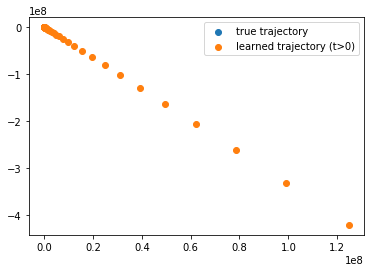

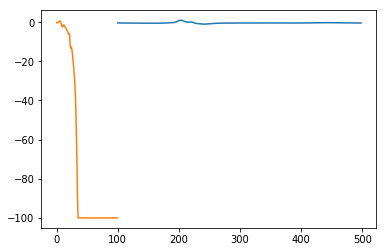

In [0]:

# take first trajectory for visualization
index = np.random.randint(samp_trajs.shape[0])
z0 = z0[index]

ts_pos = np.linspace(ntotal, ntotal+cutoff, num=cutoff)
# ts_neg = np.linspace(-cutoff, 0., num=cutoff)[::-1].copy()
ts_pos = torch.from_numpy(ts_pos).float().to(device)
# ts_neg = torch.from_numpy(ts_neg).float().to(device)

zs_pos = odeint(func, z0, ts_pos)
# zs_neg = odeint(func, z0, ts_neg)

xs_pos = dec(zs_pos)
# xs_neg = torch.flip(dec(zs_neg), dims=[0])

xs_pos = xs_pos.detach().cpu().numpy()
# xs_neg = xs_neg.detach().cpu().numpy()
orig_traj = orig_trajs[0].detach().cpu().numpy()
samp_traj = samp_trajs[0].detach().cpu().numpy()

plt.figure()
plt.scatter(orig_traj[:, 0], orig_traj[:, 1], label='true trajectory')
plt.scatter(xs_pos[:, 0], xs_pos[:, 1], label='learned trajectory (t>0)')
# plt.plot(xs_neg[:, 0], xs_neg[:, 1], label='learned trajectory (t<0)')
plt.legend()
plt.show()

plt.figure()
plt.plot(np.arange(cutoff, ntotal), samp_trajs[index,:, 1].detach().cpu().numpy())
plt.plot(np.arange(0, cutoff), np.clip(xs_pos[:, 1], -100, 100))
# plt.plot(np.arange(ntotal, ntotal+cutoff), np.clip(xs_neg[:, 1], -100,  100))
plt.show()